In [1]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:40397")
client

<Client: 'tcp://127.0.0.1:40397' processes=8 threads=32, memory=125.85 GiB>

In [2]:
import numpy as np
import xarray as xr
import pandas as pd
import os.path as op
import os
import xrft
import xwavelet
from scipy.interpolate import griddata
from xgcm.grid import Grid
from xmitgcm import open_mdsdataset
import matplotlib.pyplot as plt
import matplotlib.colors as clr
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
ddir = '/tank/chaocean/qjamet/RUNS/ORAR/reruns2/'
gdir = '/tank/chaocean/grid_chaO/gridMIT_update1/'
spec = '/tank/spectre/tuchida/NA-wavelets/'
diag = '/tank/spectre/tuchida/diagnostics/'
savedir = '/tank/spectre/tuchida/chaocean/Snap/'

In [5]:
grav = 9.81
nensembs = 5
Kh = 20.
K4 = 1e10
Kr = 1e-5
thetaMax = 1e20
rhoConst = 9.998e2
Cp = 3.994e3
ySstart = -19.8
yNstart = 10
yend = 50

tchunk = 1
xchunk = 200
ychunk = 200

ntheta = 36
xo = 50e3

In [14]:
dnf = 2160
nfile = 73
years = np.arange(1963,2013,dtype=int)
ntimes = (np.arange(790560,8672400+dnf,dnf).reshape(len(years),nfile) 
          - dnf)
dd = 48
yystart = 4
ntimes[yystart,dd:][::3]

array([1522800, 1529280, 1535760, 1542240, 1548720, 1555200, 1561680,
       1568160, 1574640])

In [15]:
critt = .7

# $w'b^\dagger$ spectral transfer

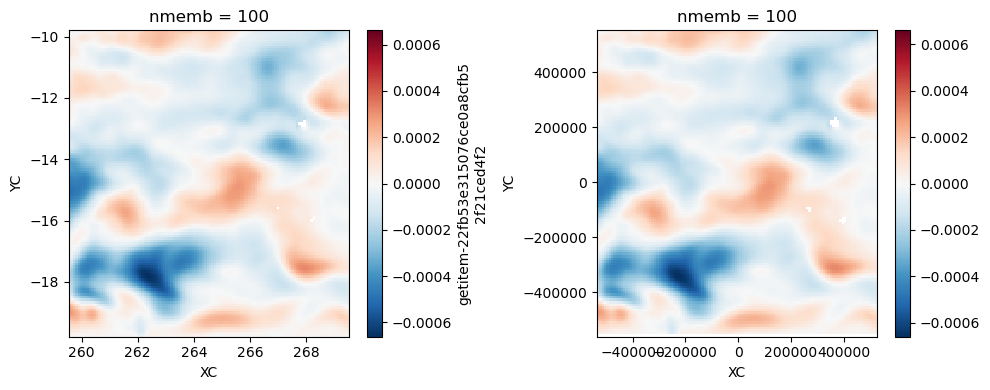

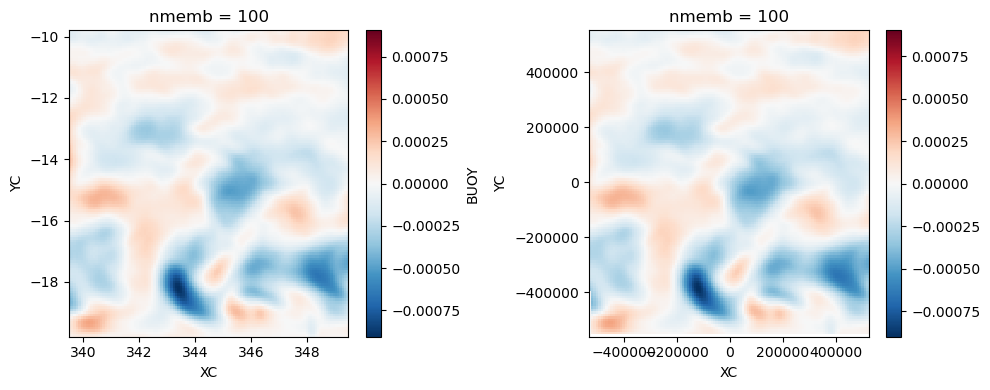

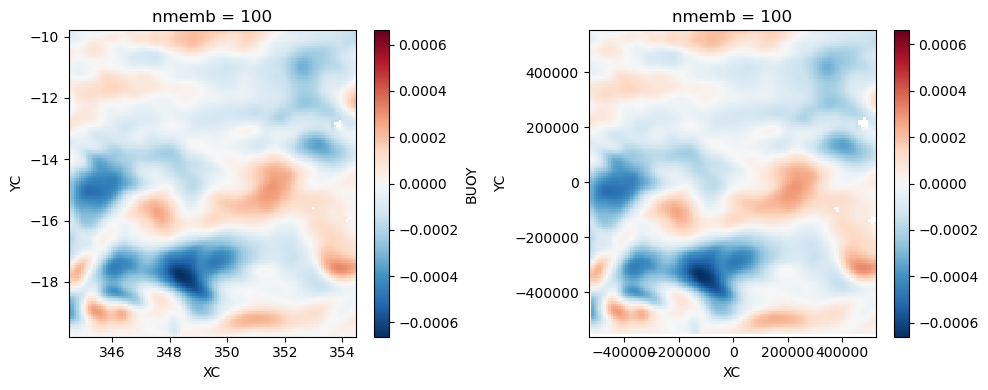

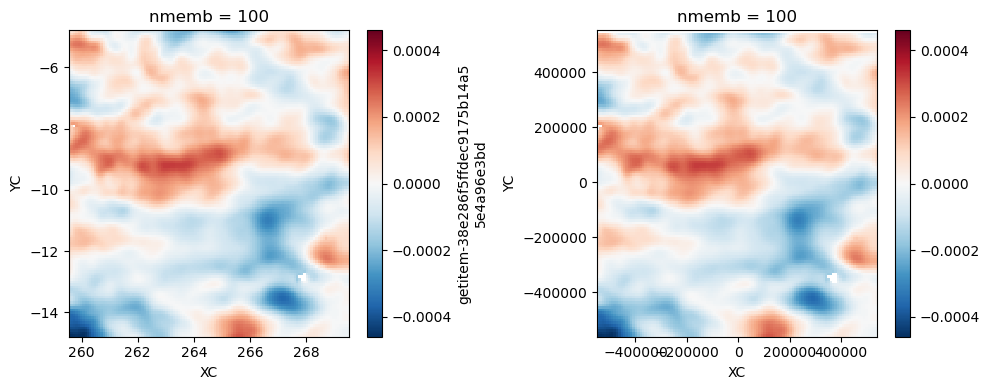

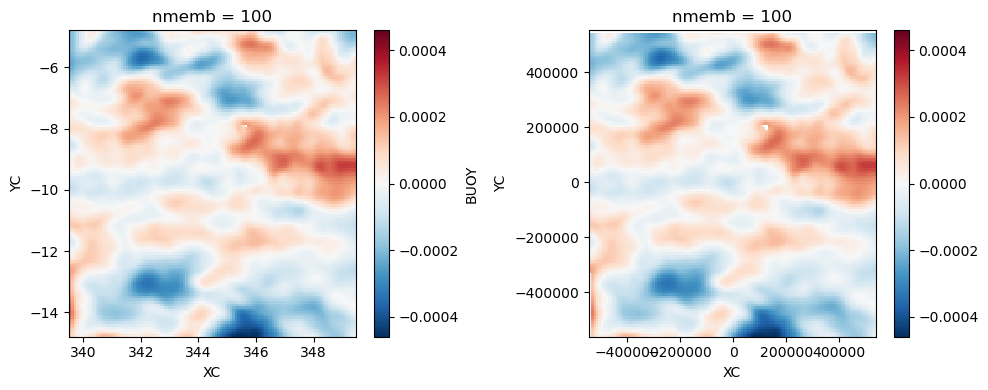

...

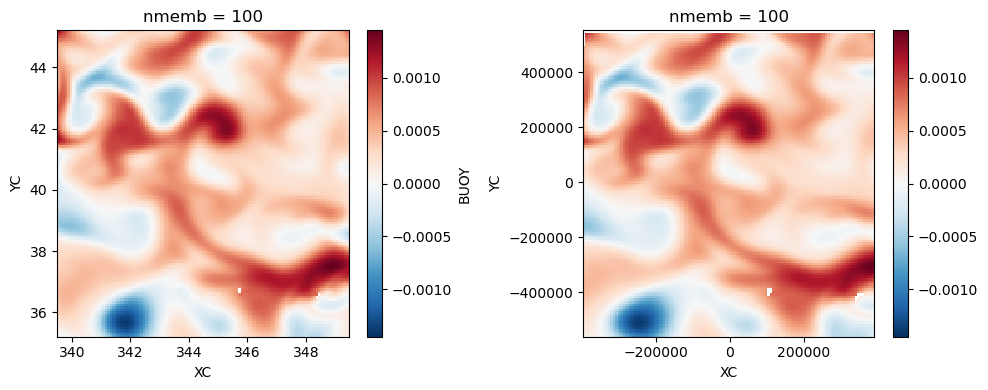

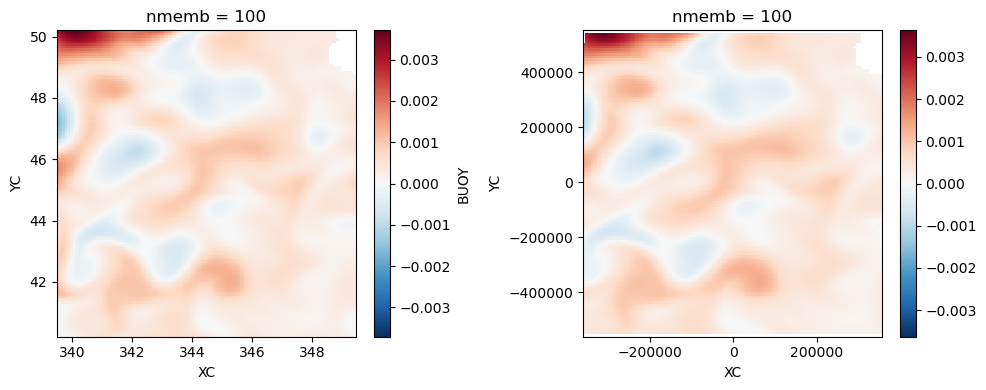

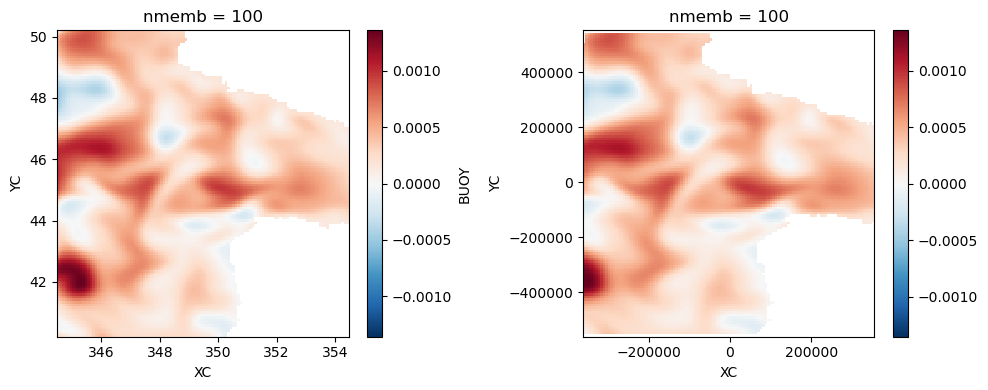

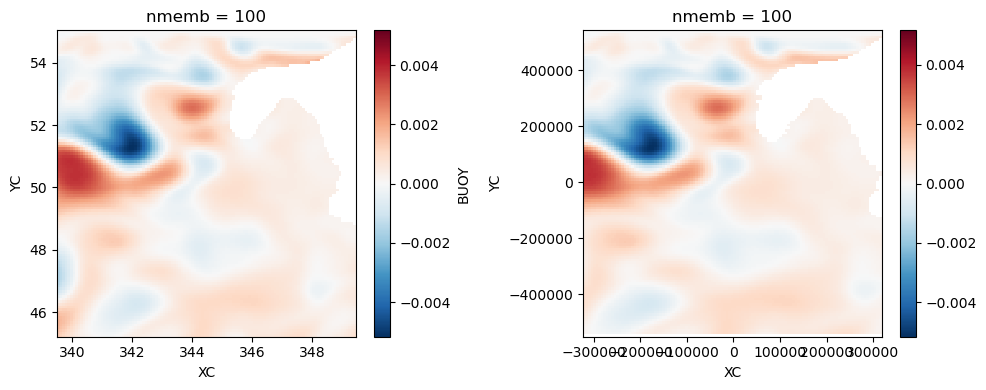

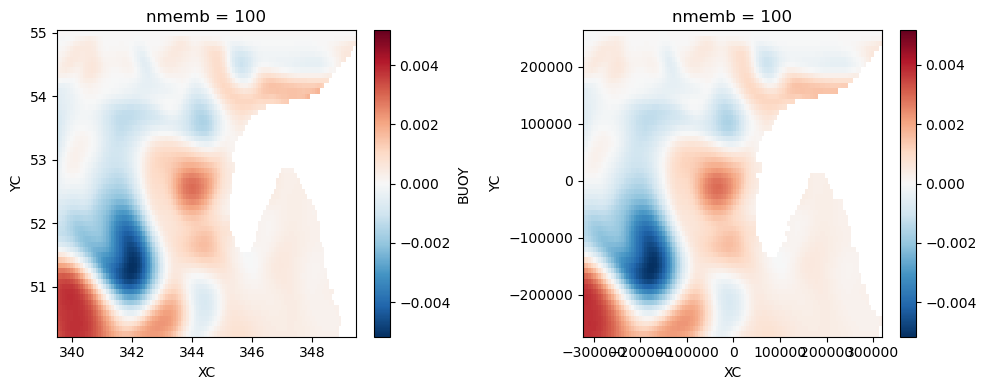

1522800


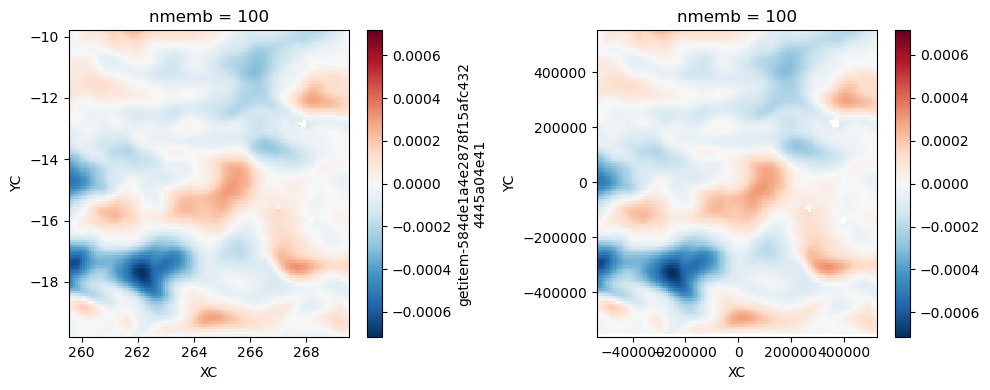

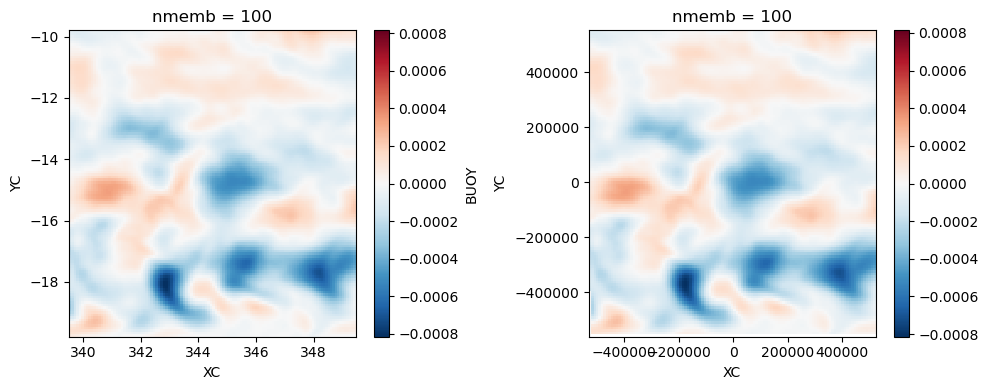

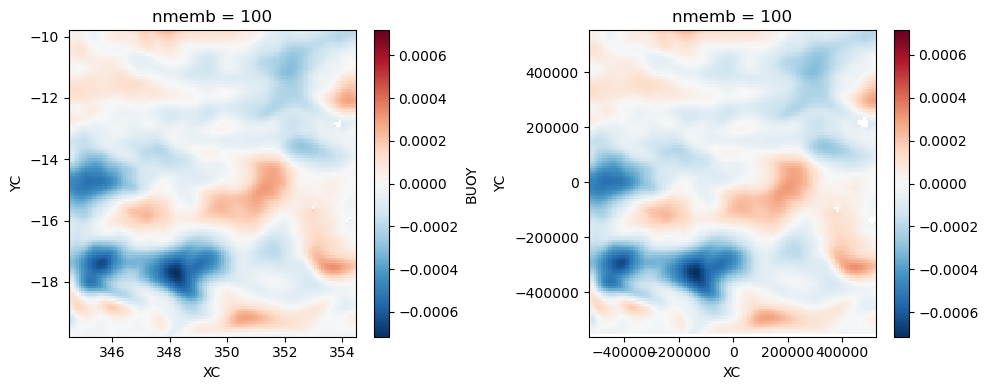

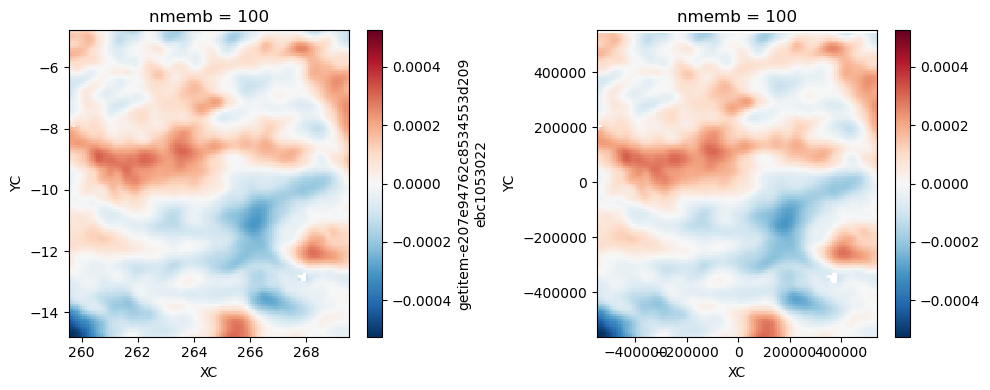

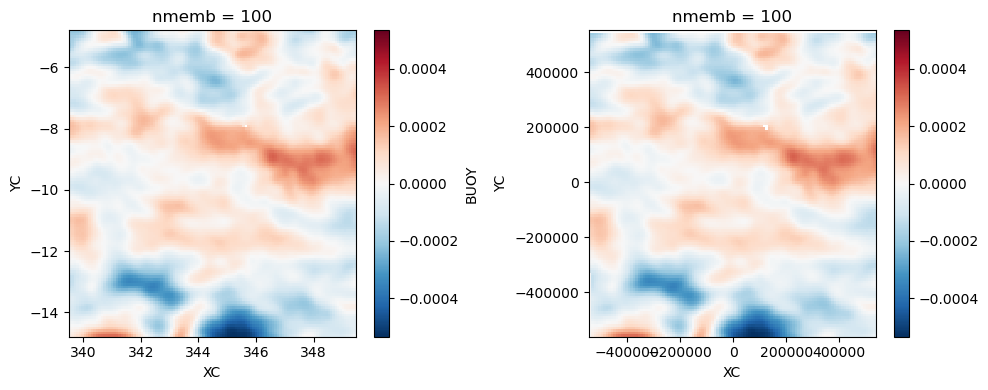

...

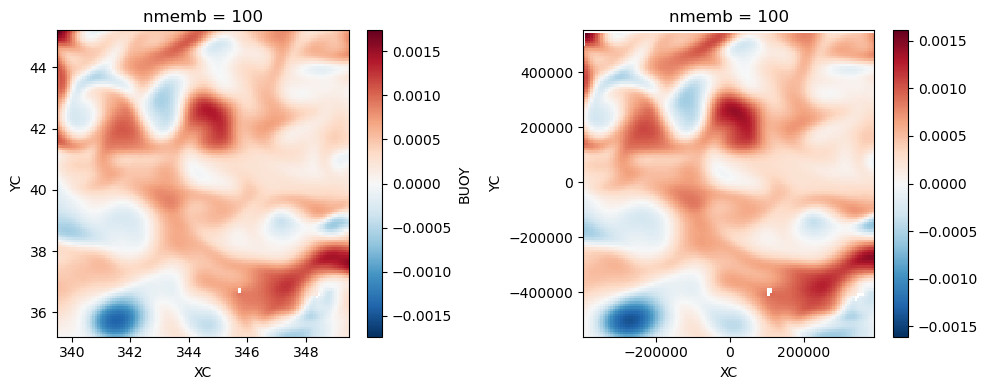

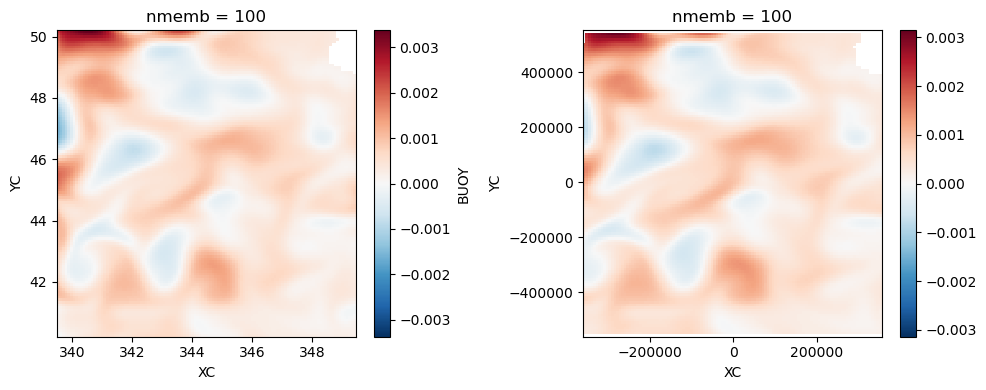

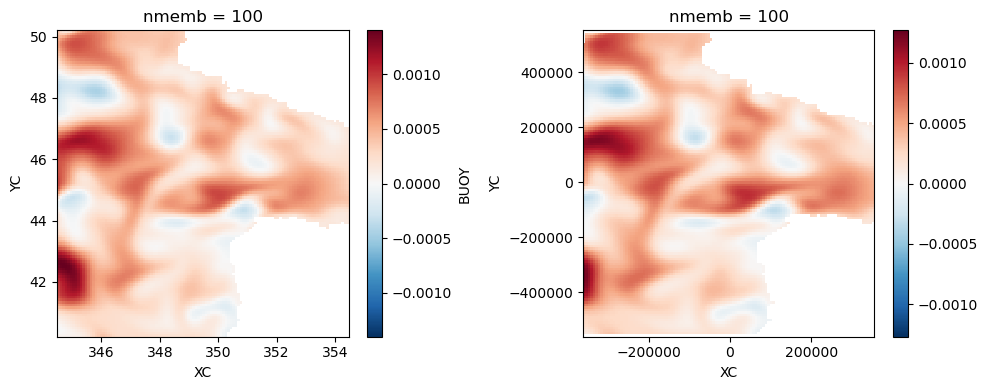

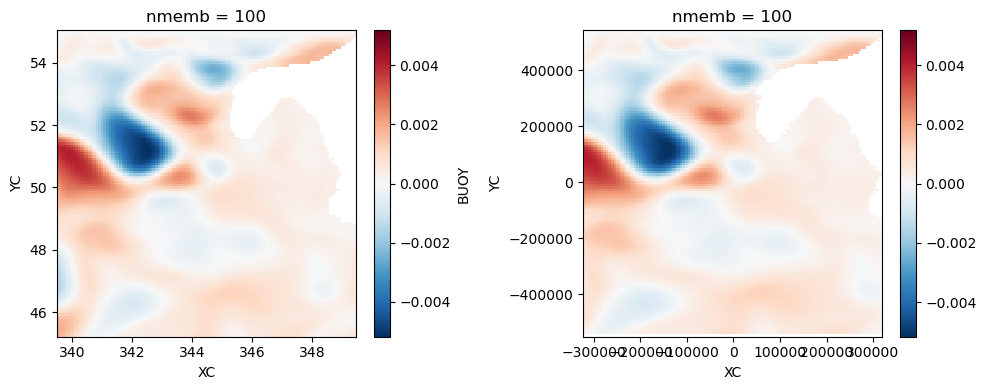

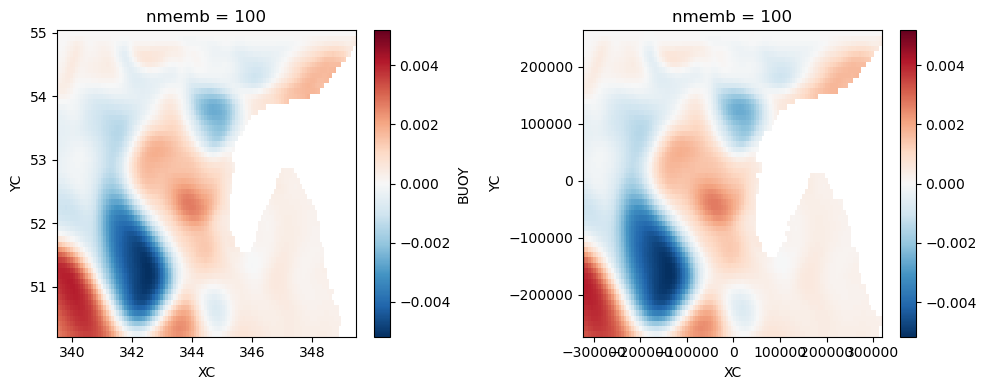

1529280


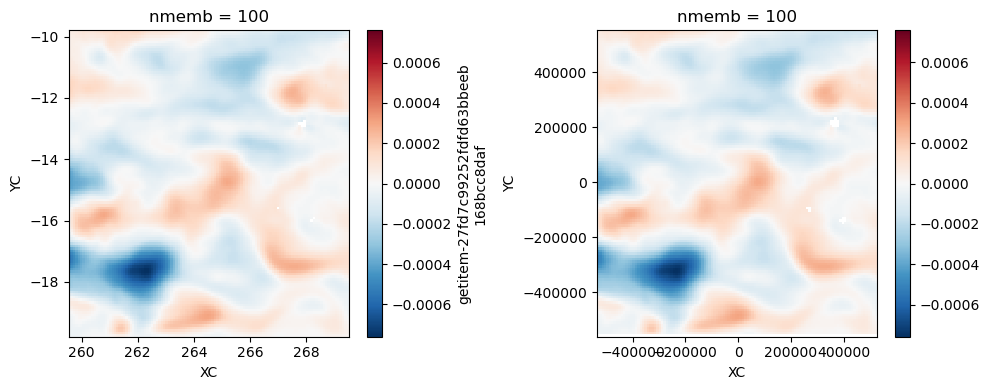

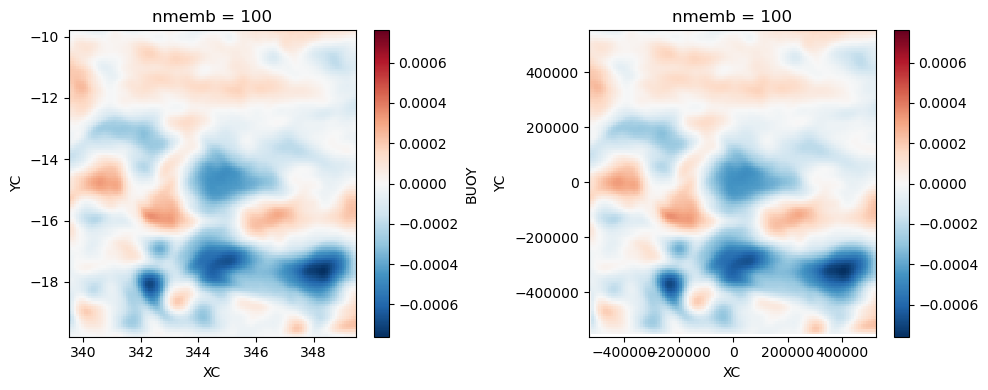

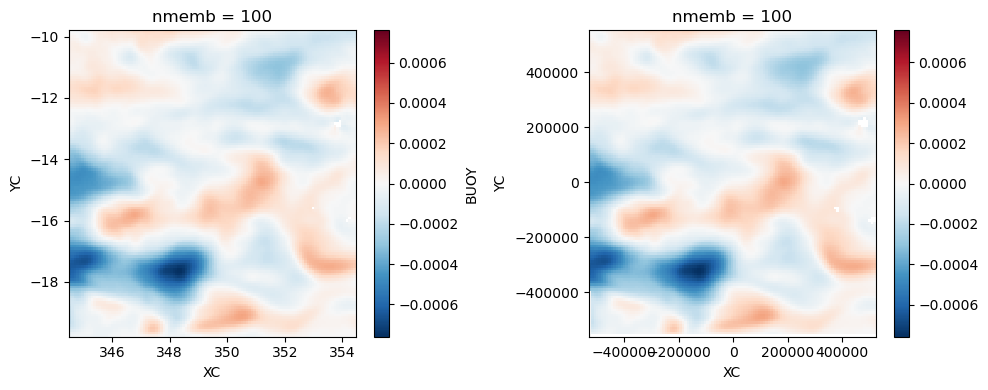

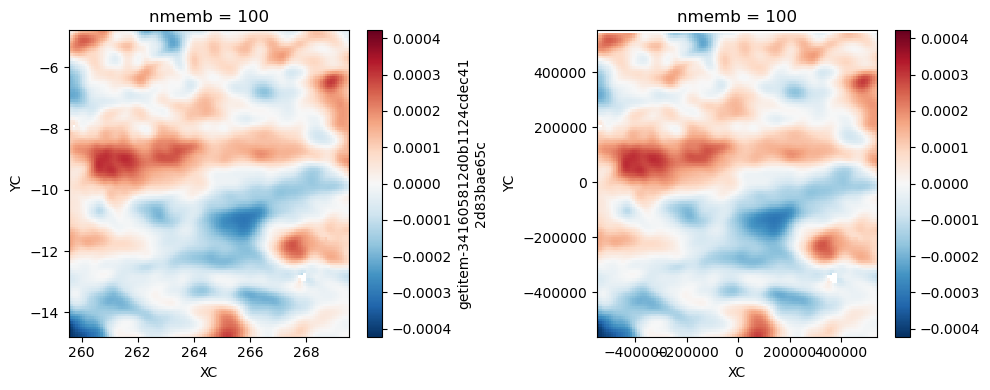

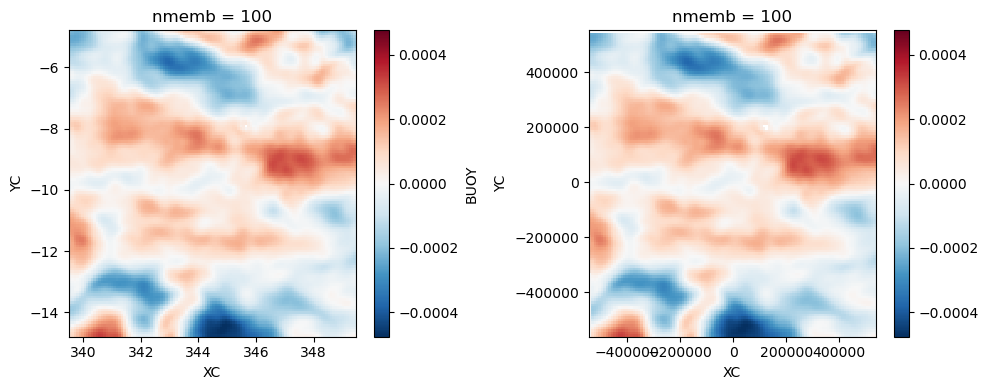

...

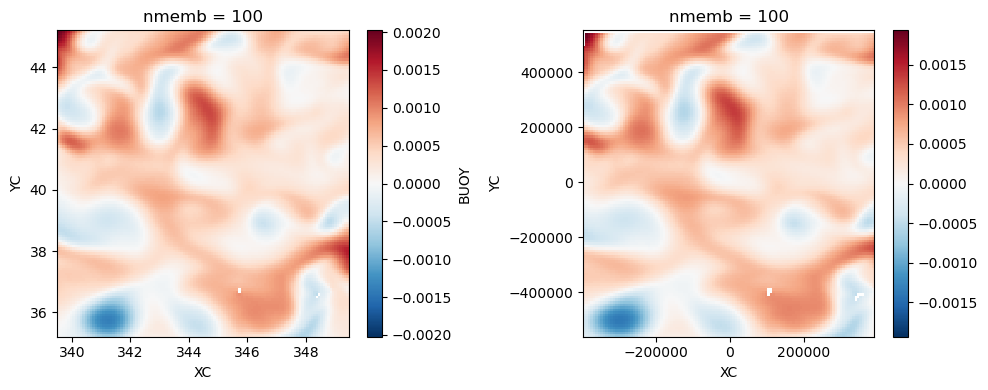

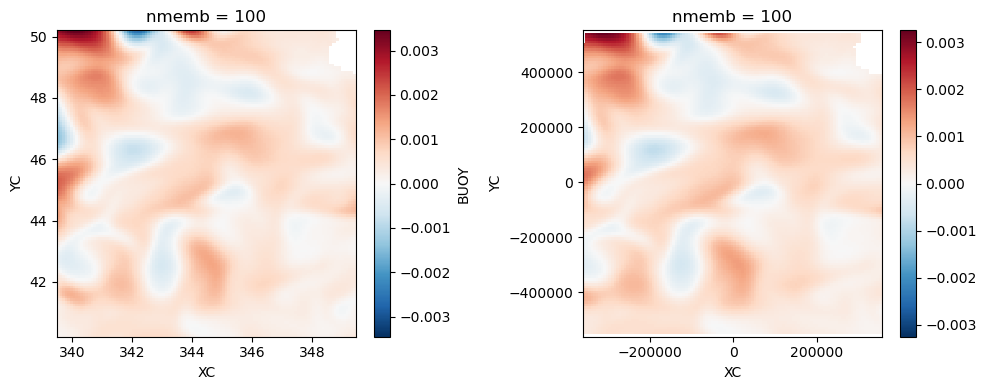

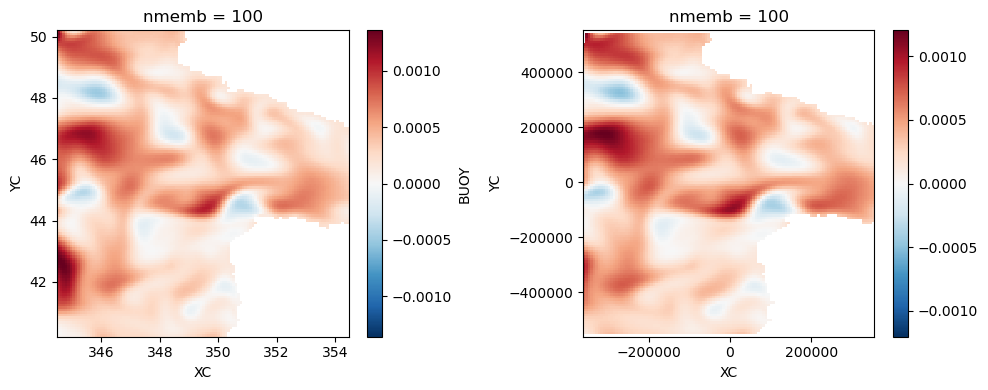

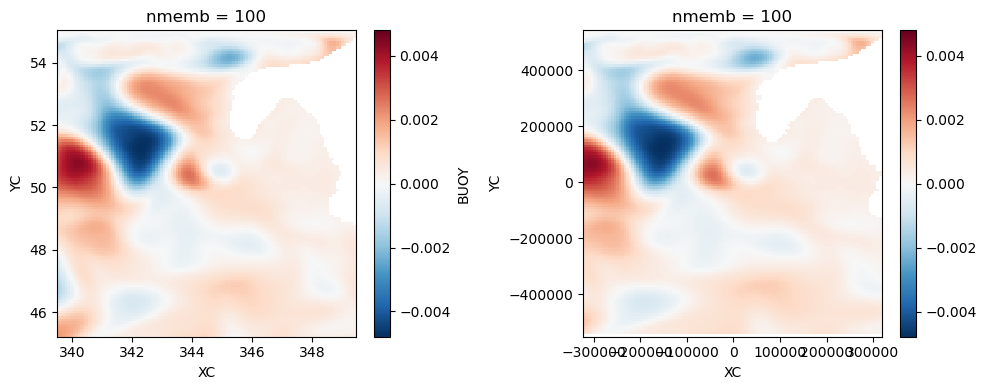

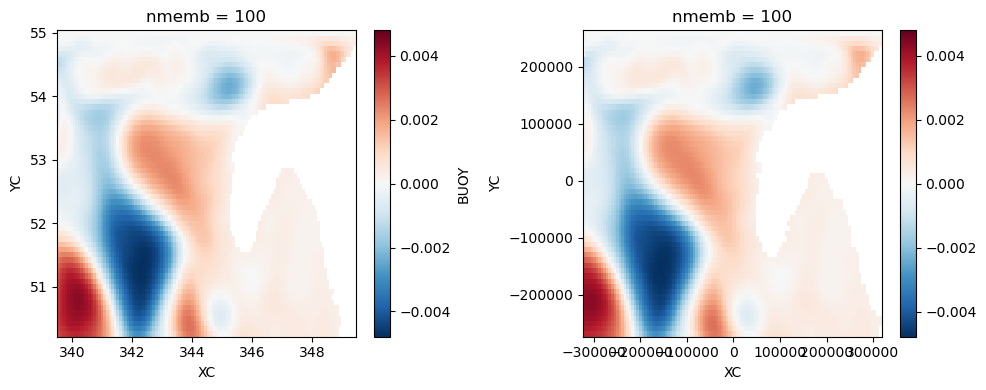

1535760


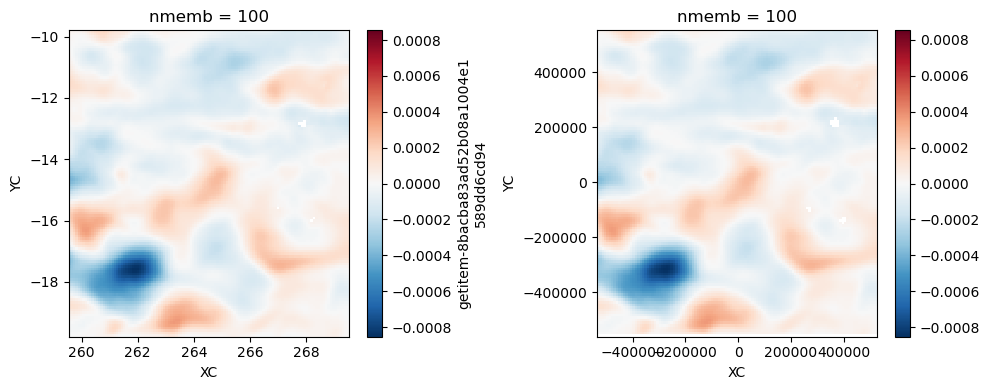

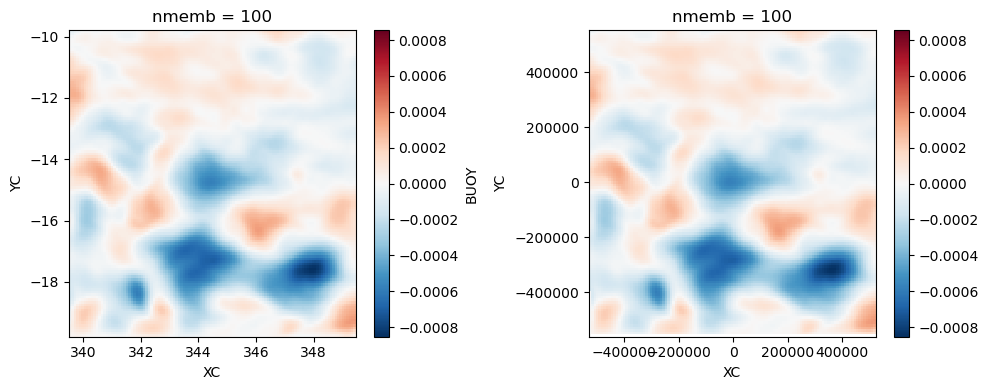

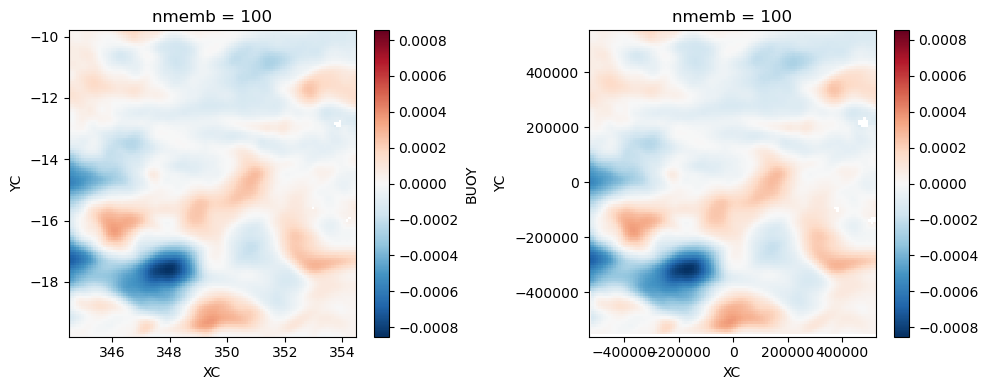

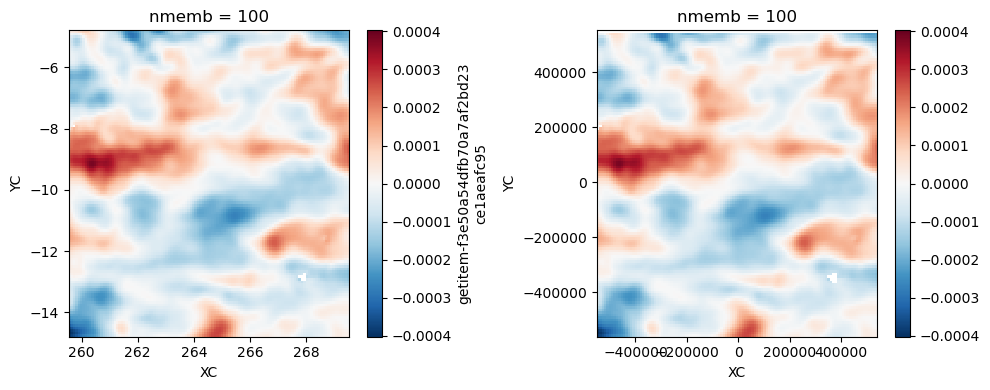

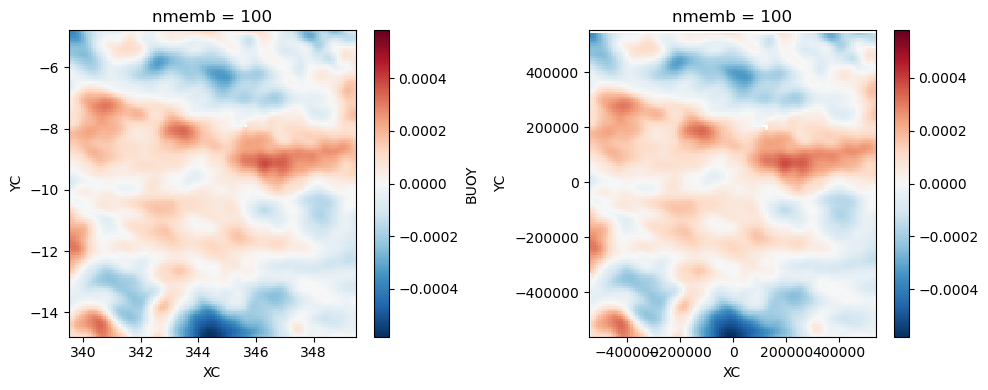

...

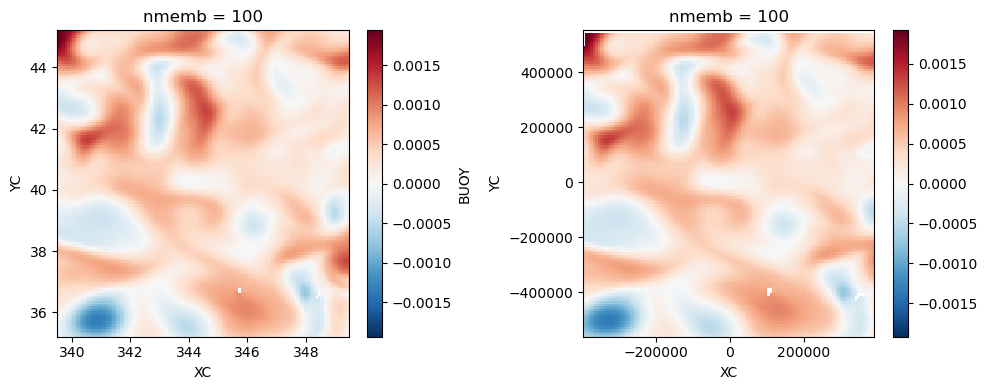

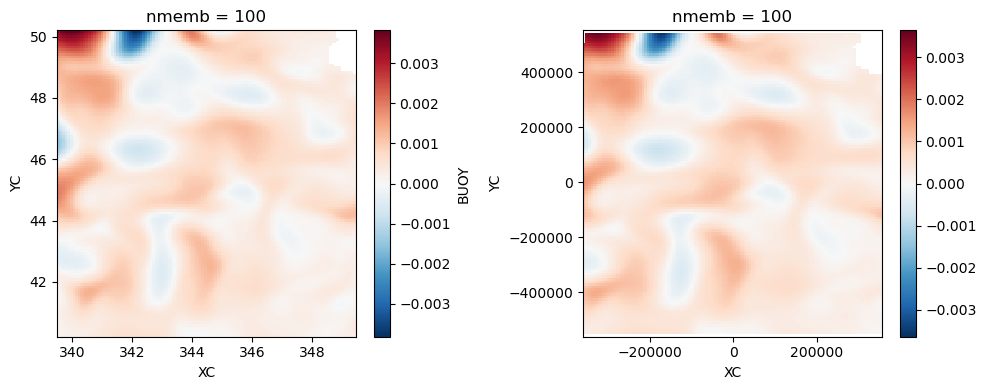

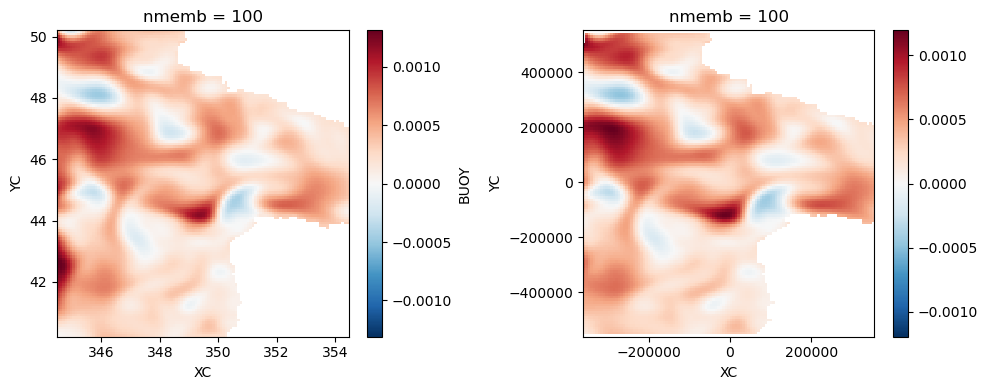

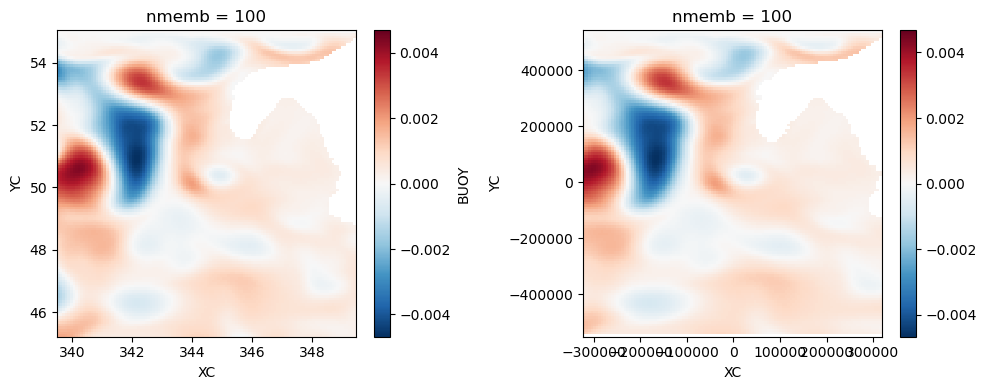

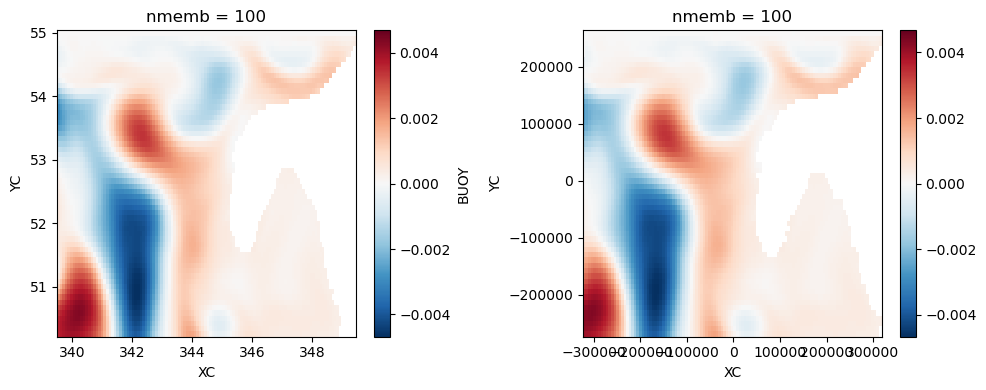

1542240


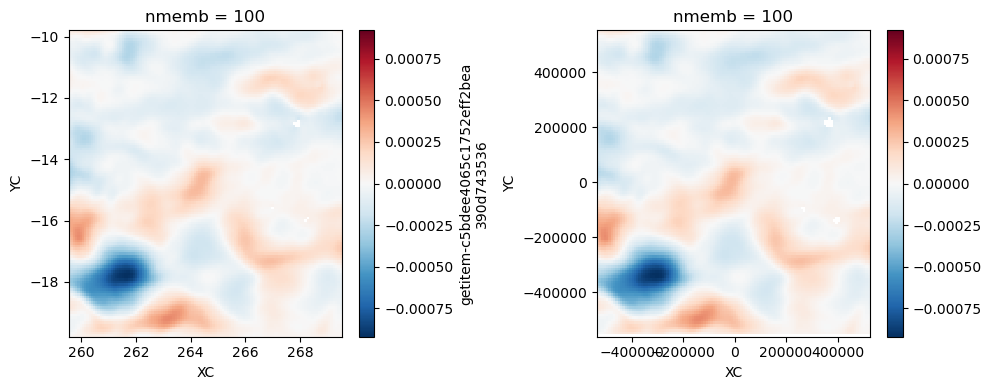

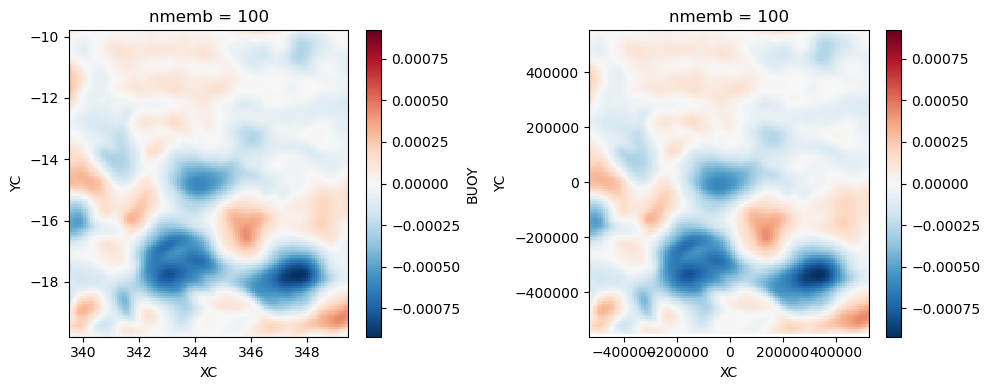

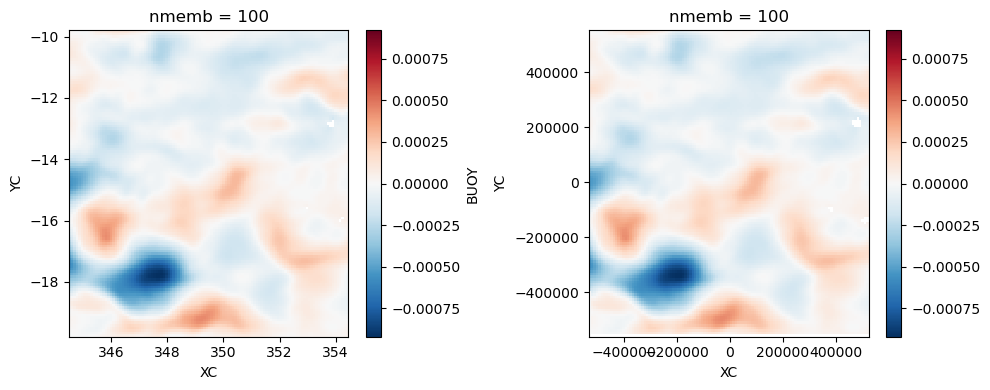

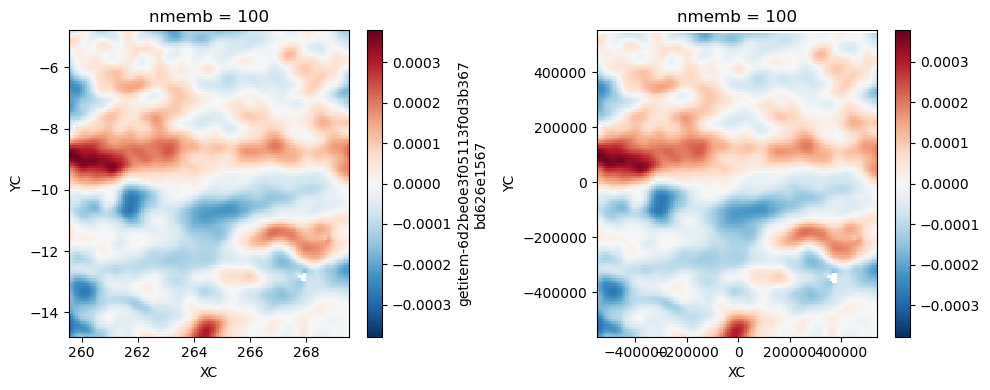

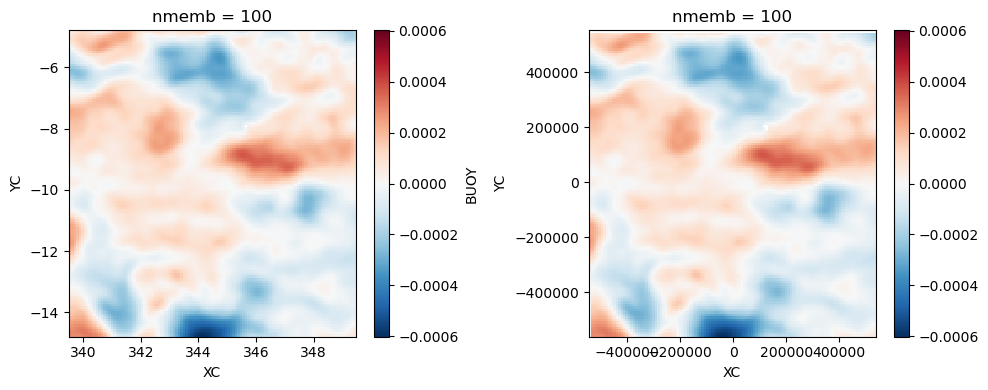

...

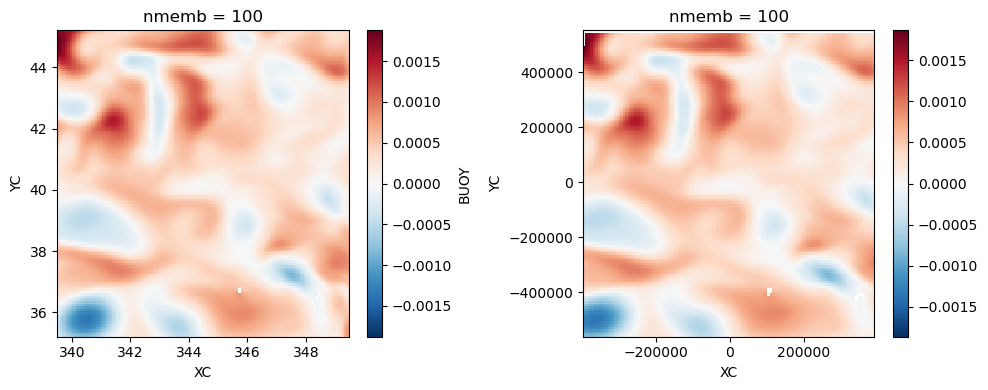

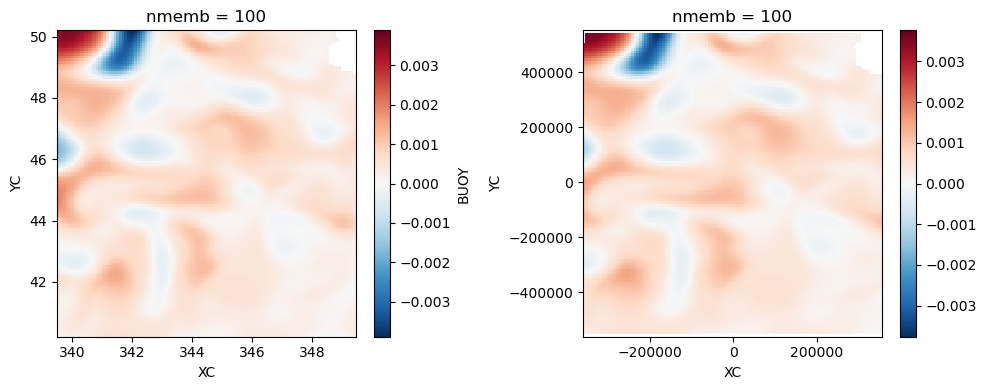

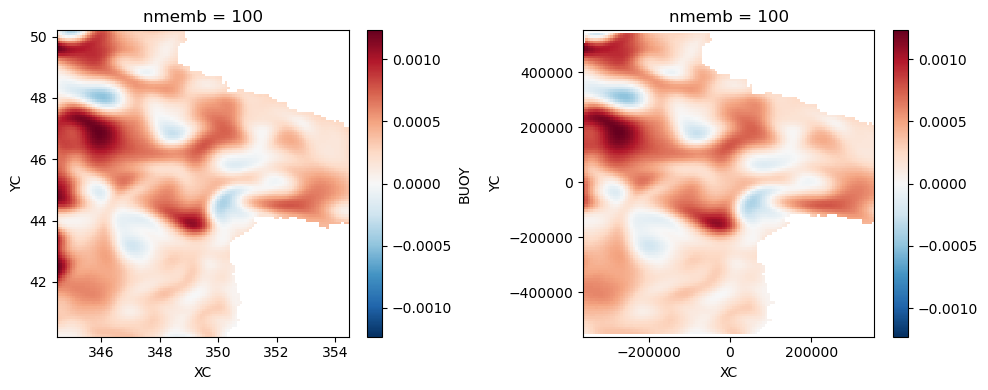

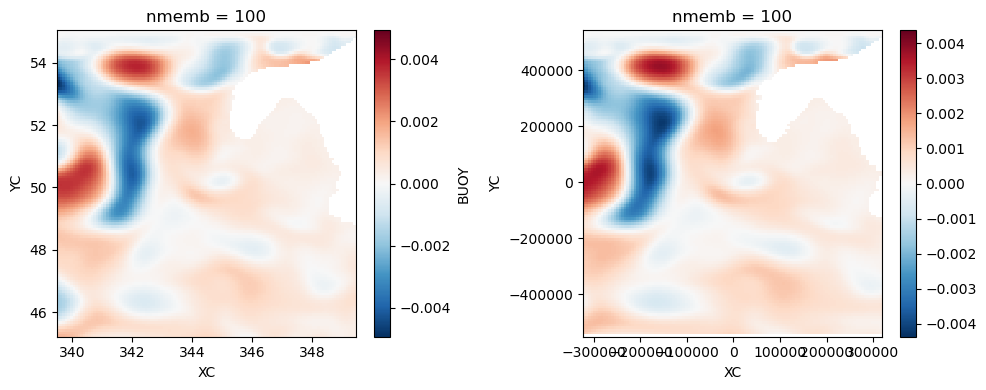

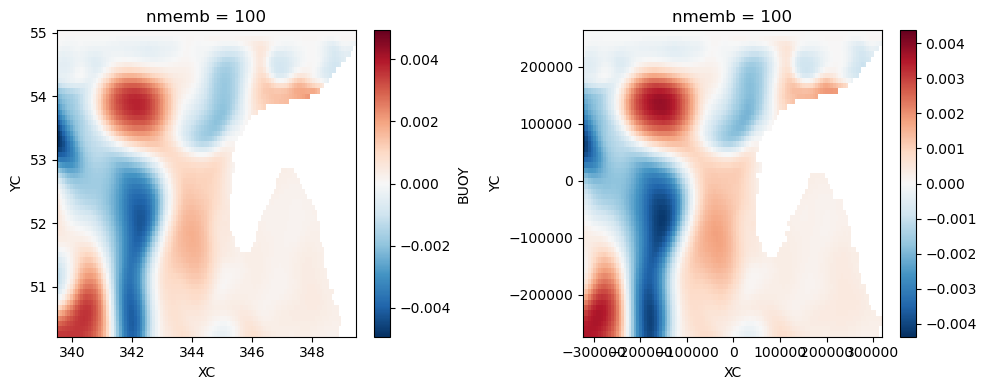

1548720


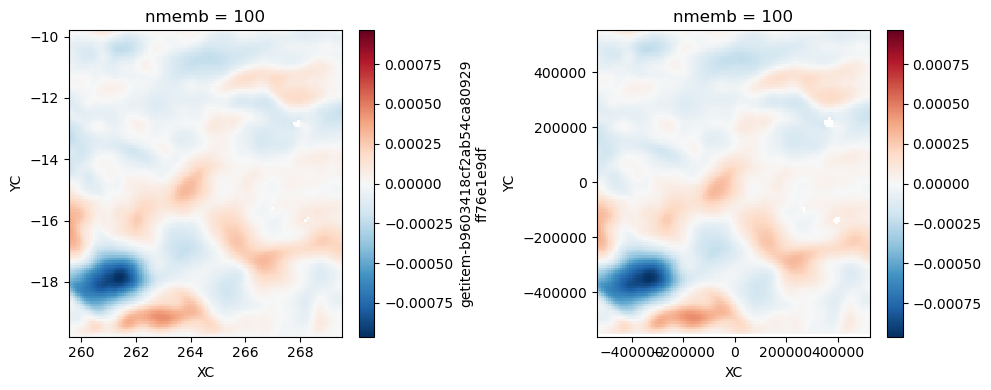

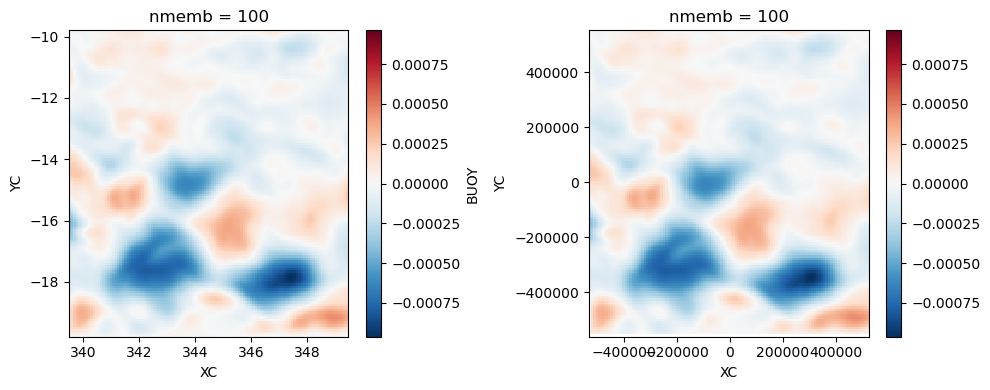

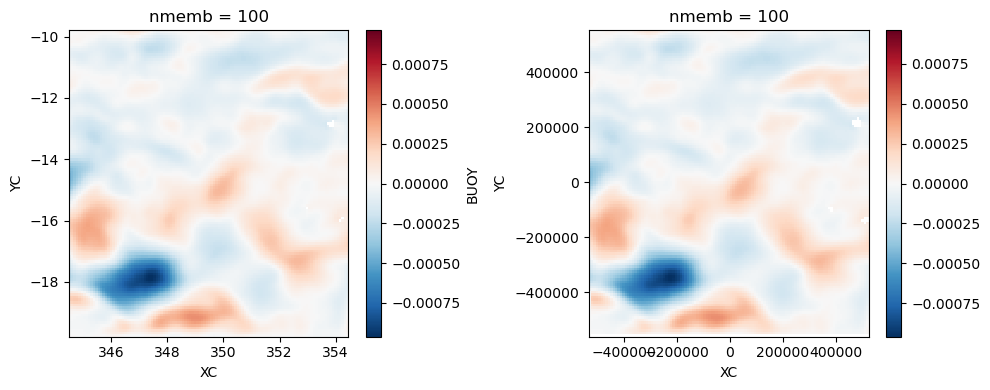

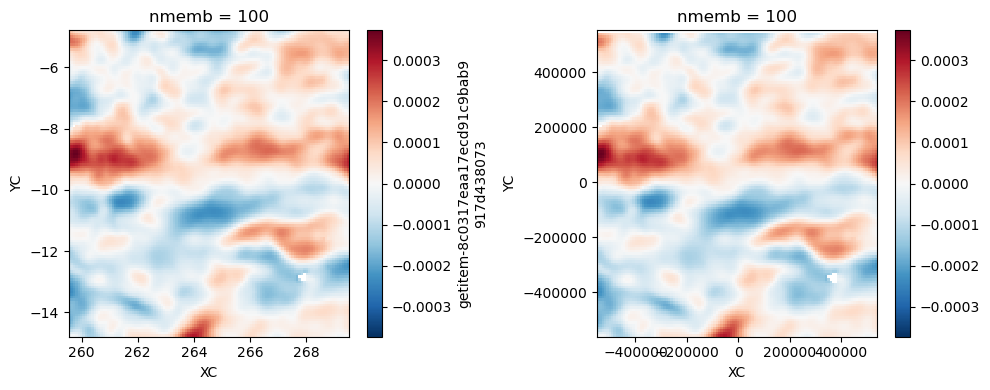

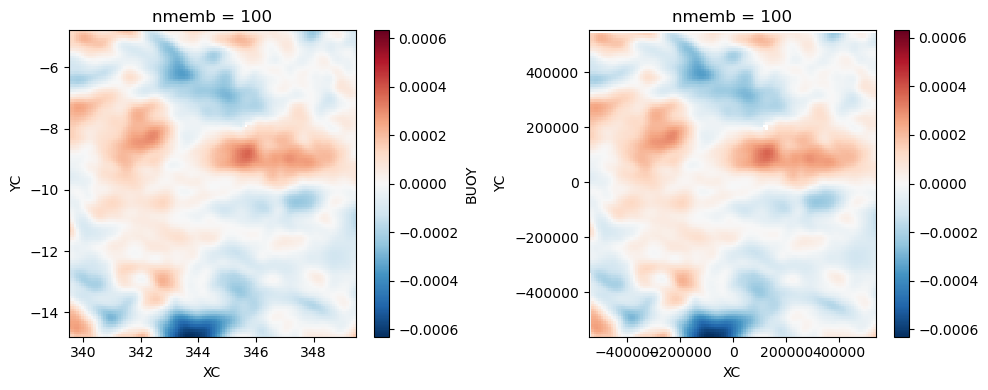

...

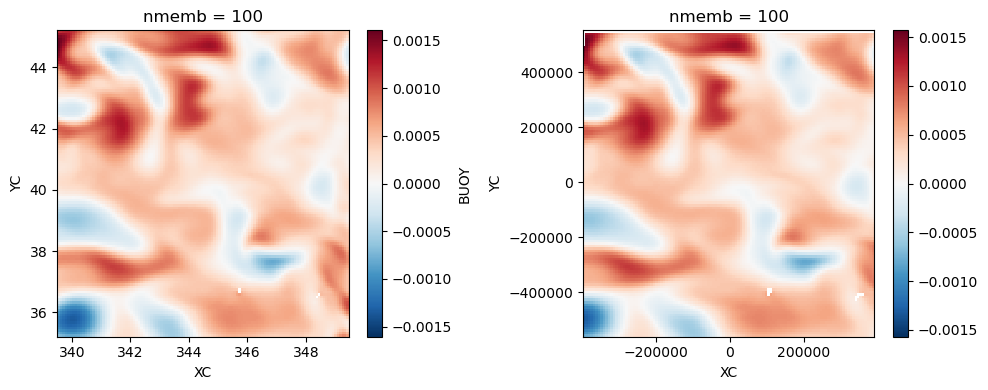

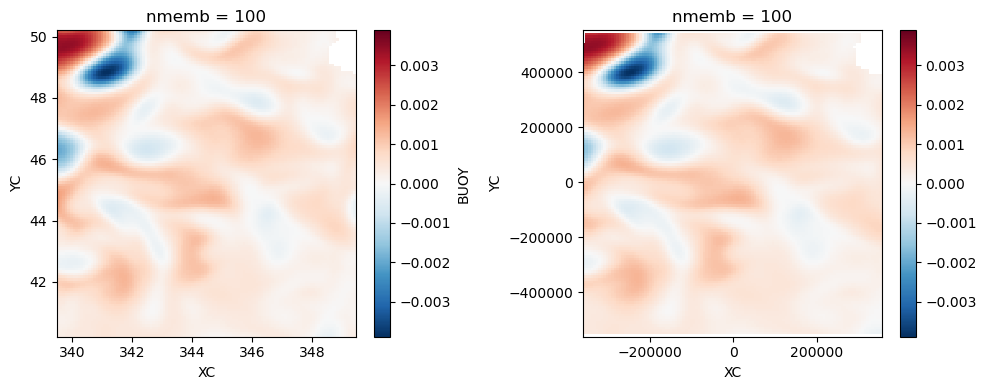

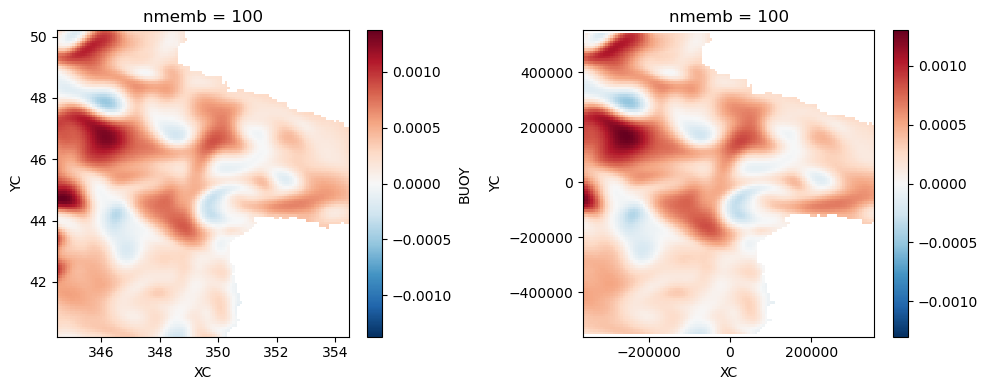

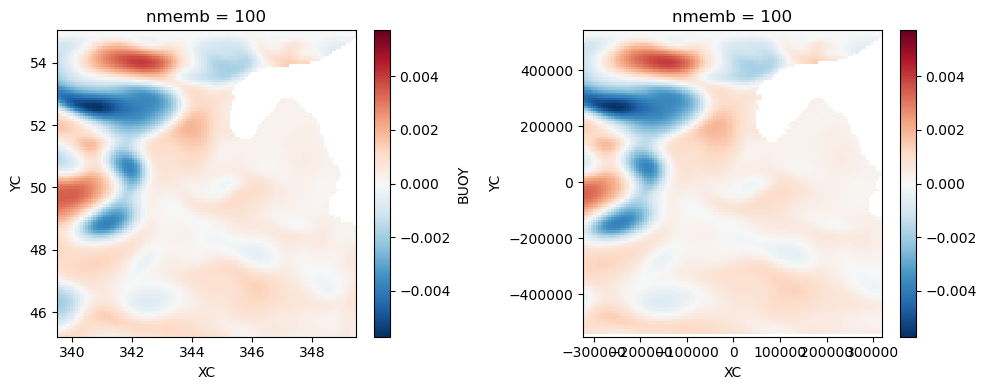

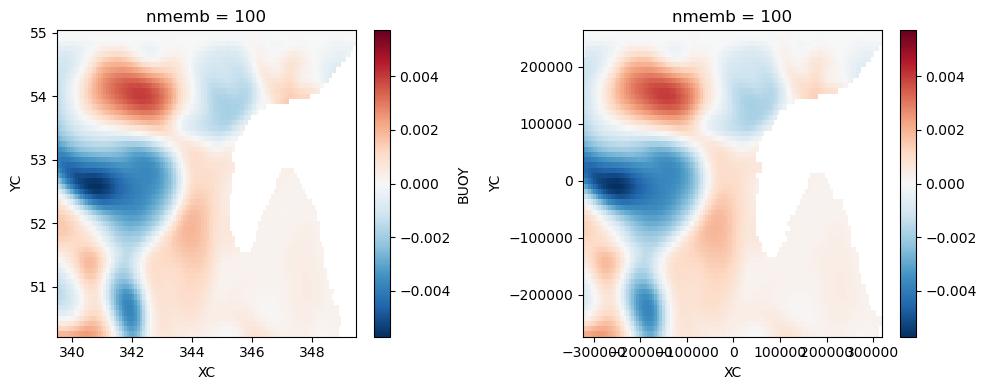

1555200


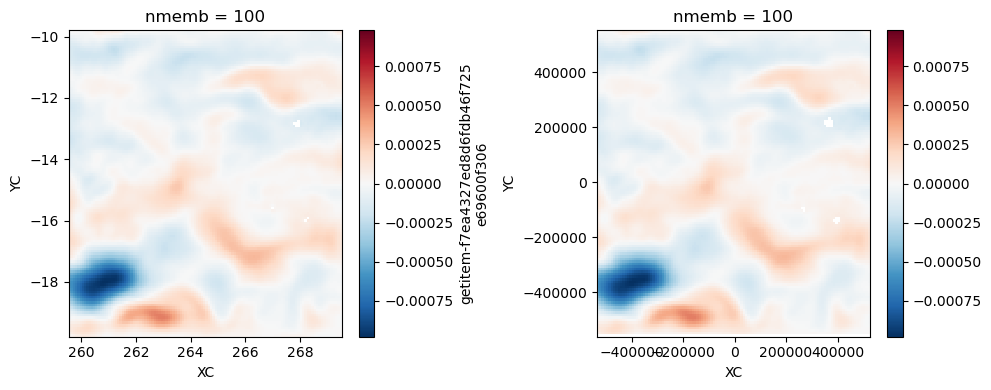

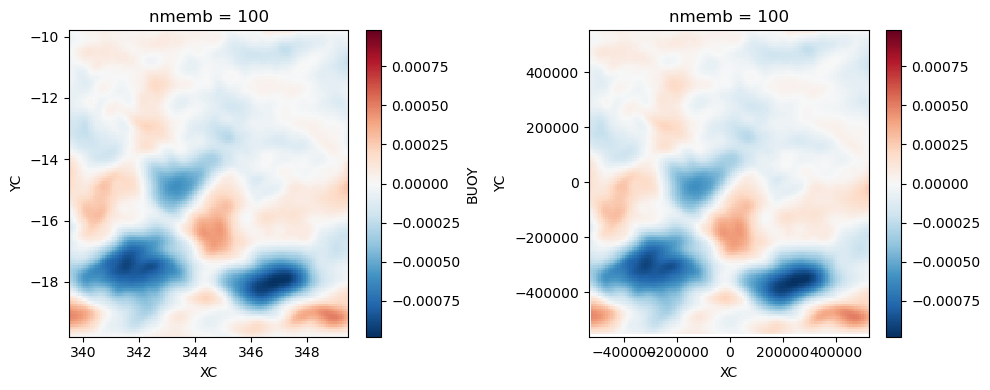

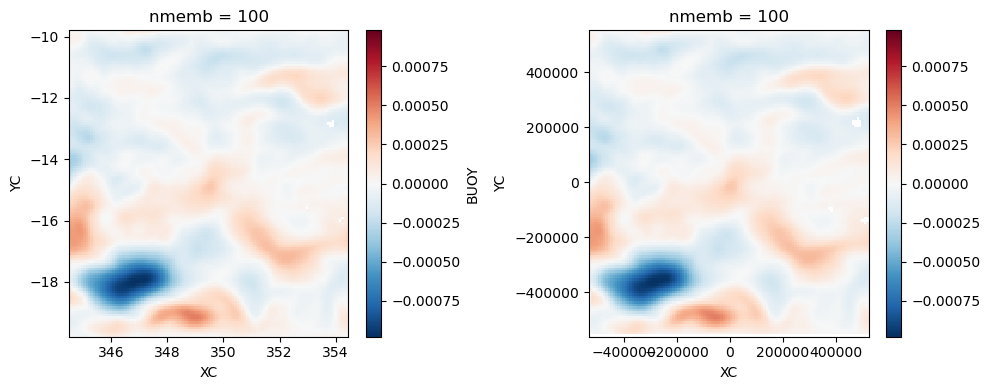

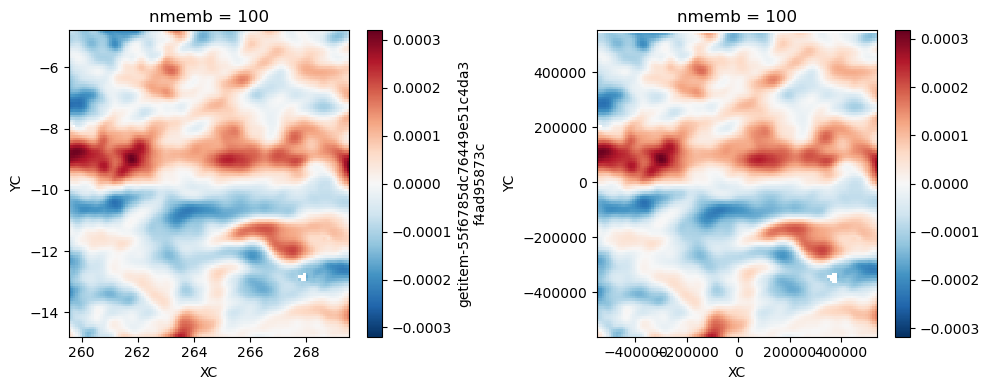

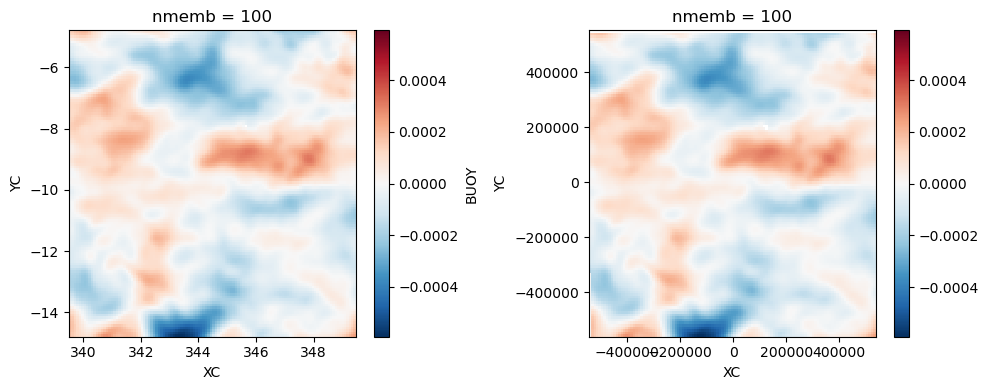

...

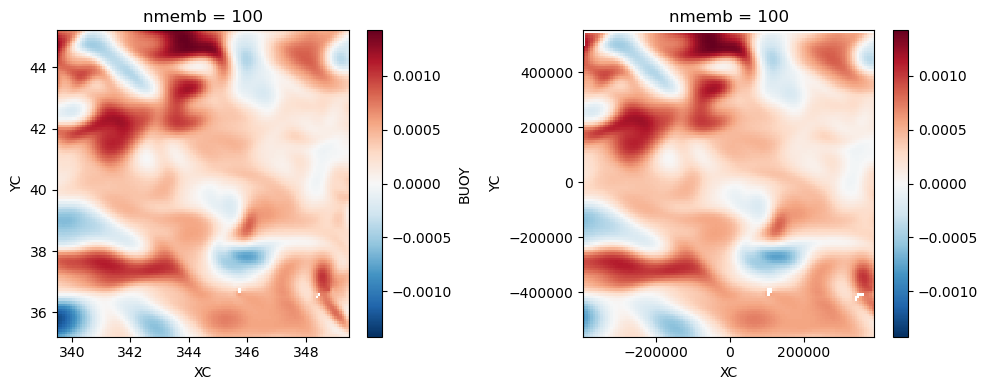

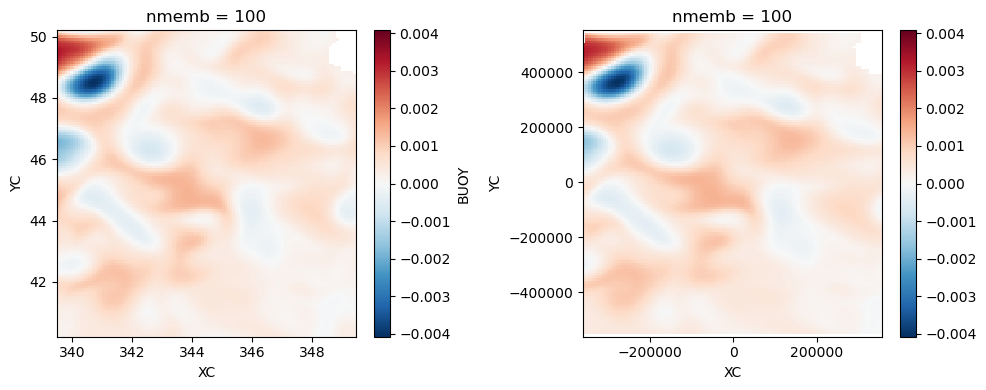

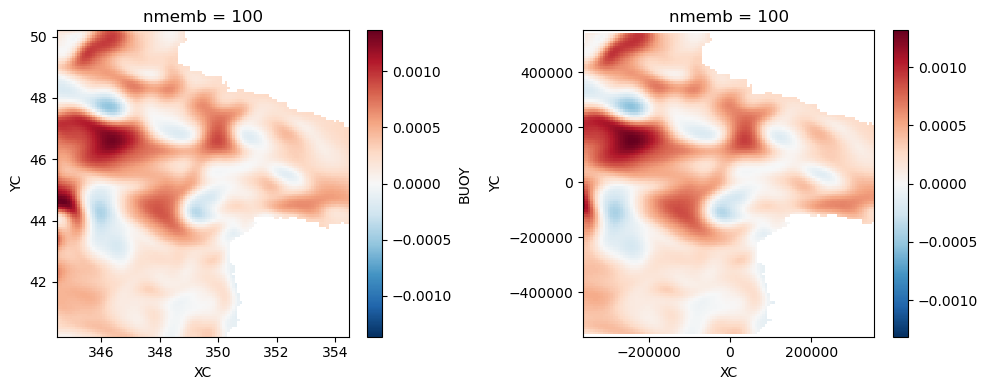

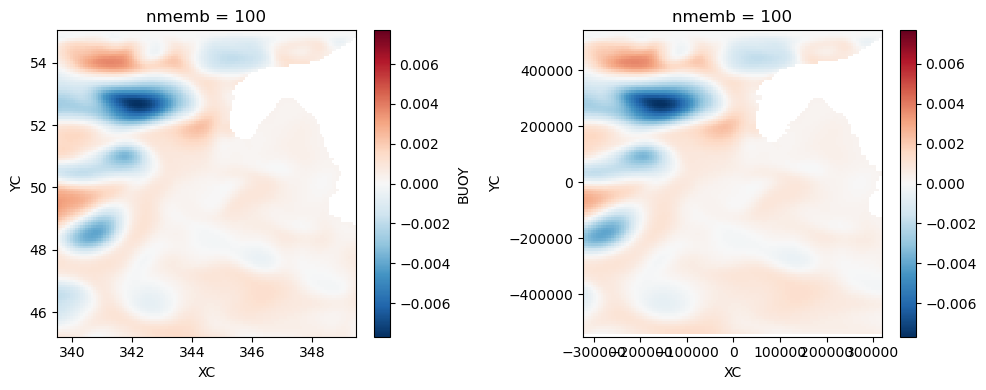

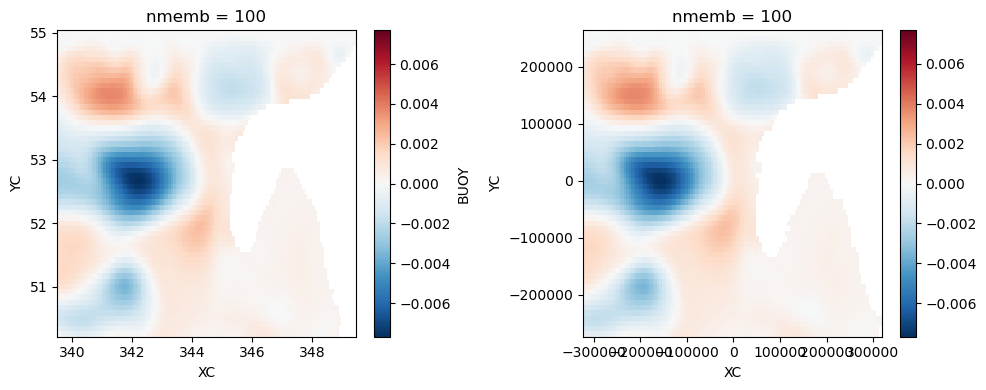

1561680


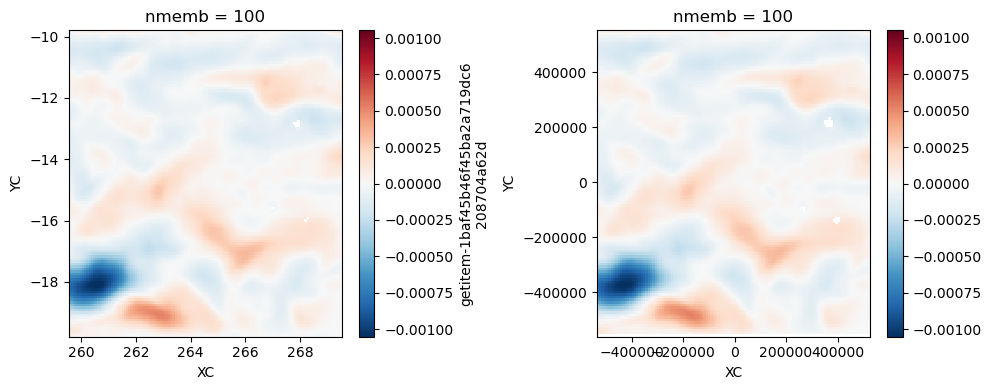

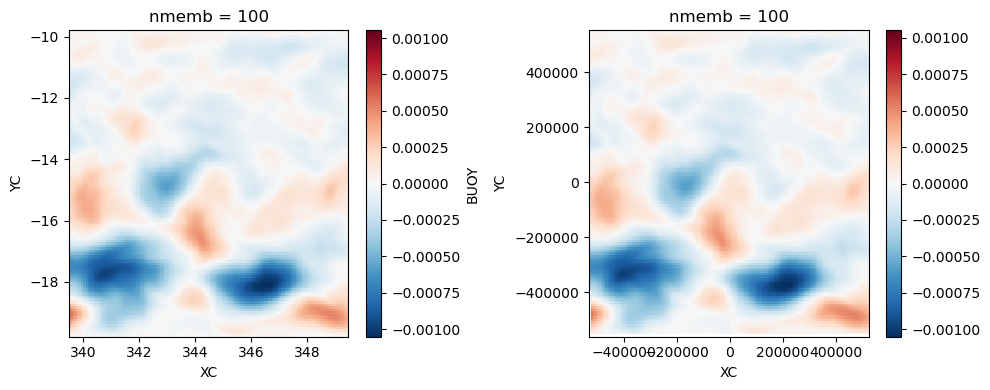

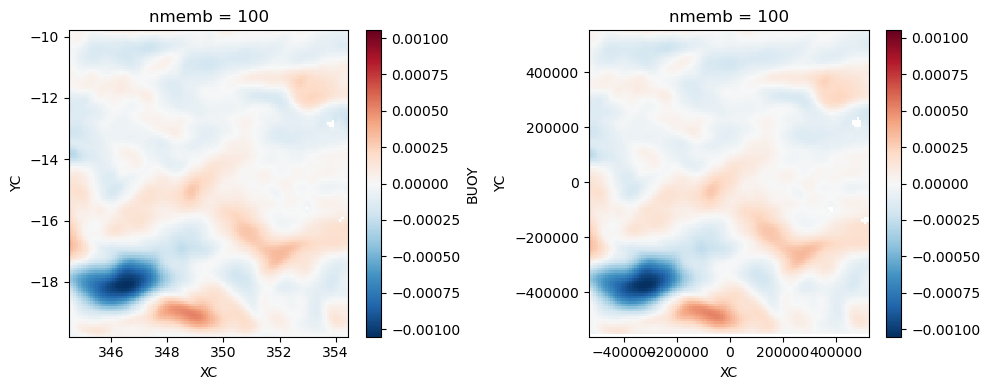

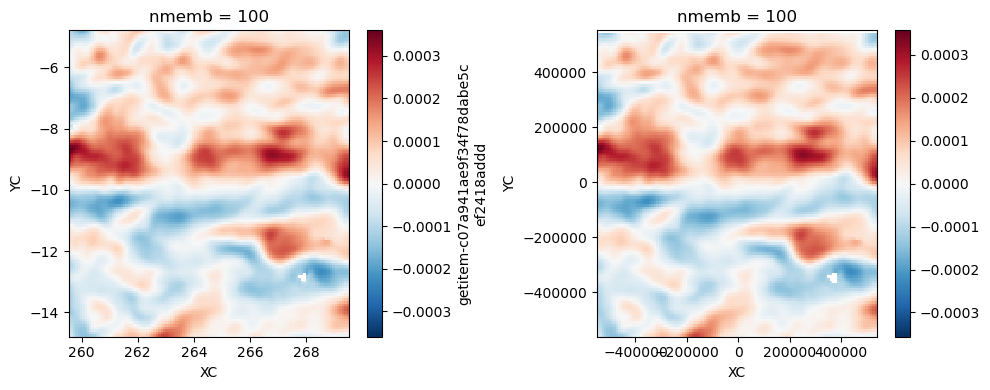

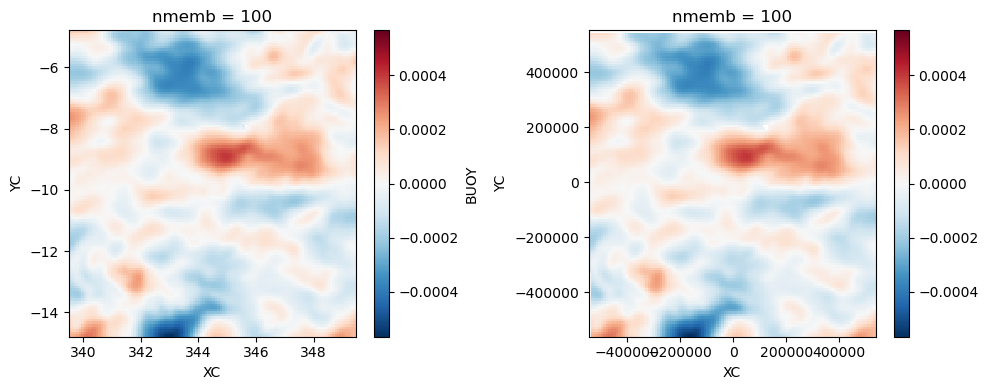

...

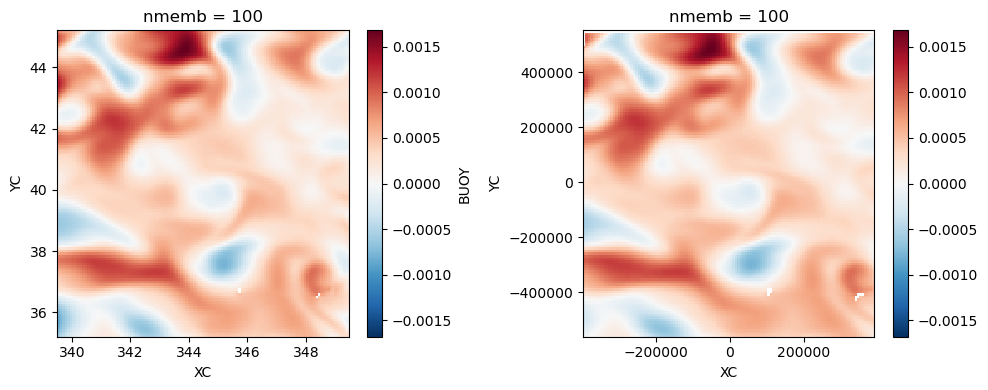

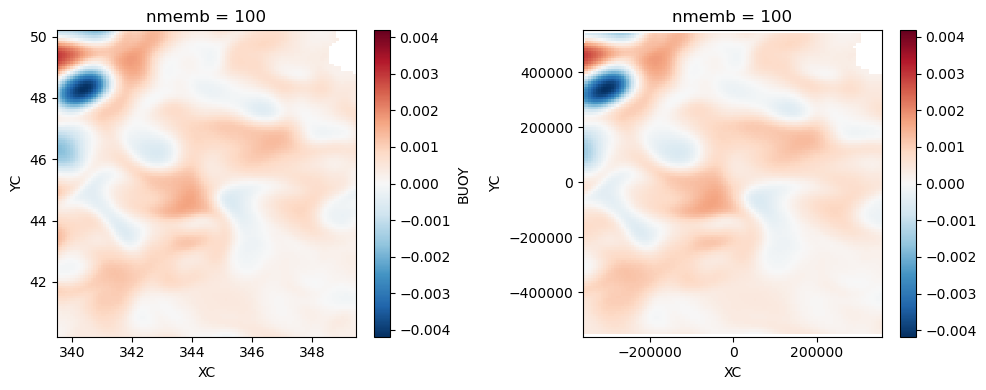

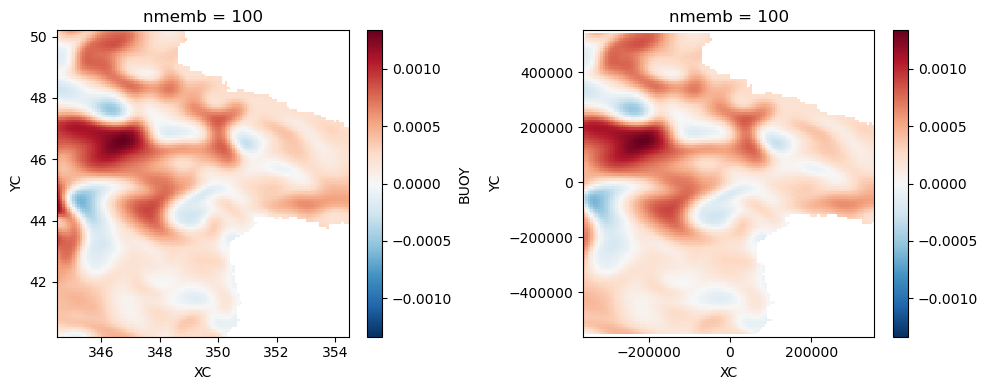

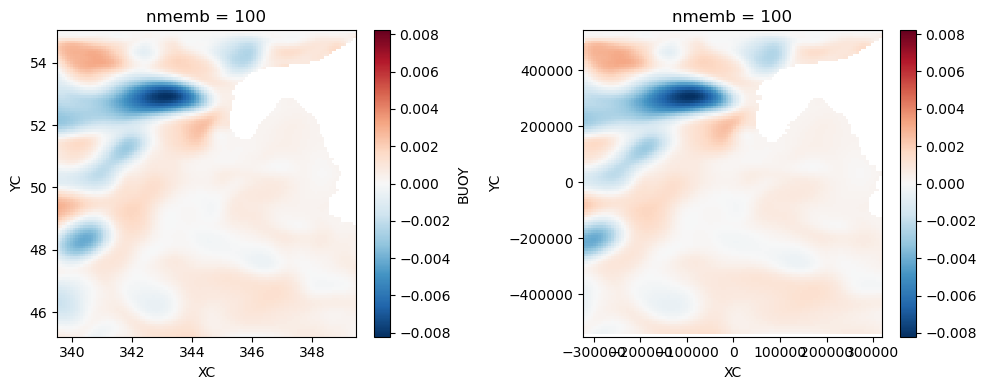

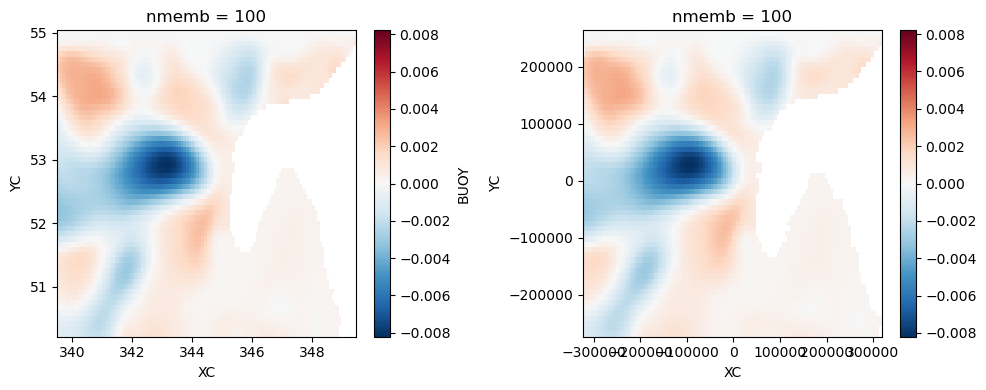

1568160


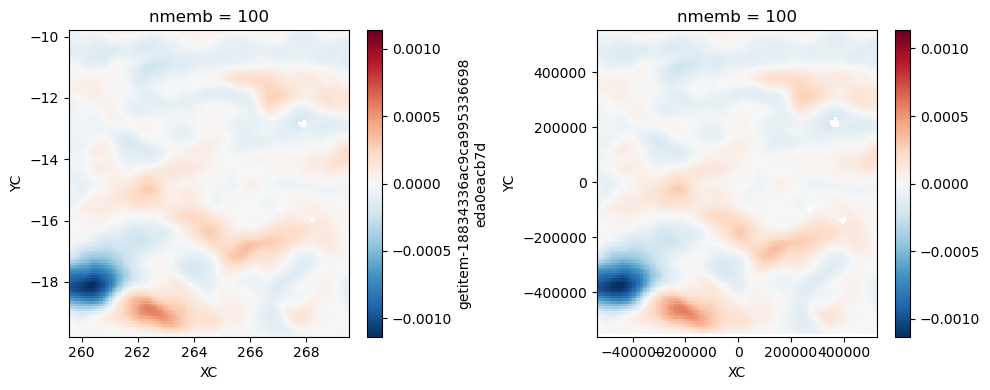

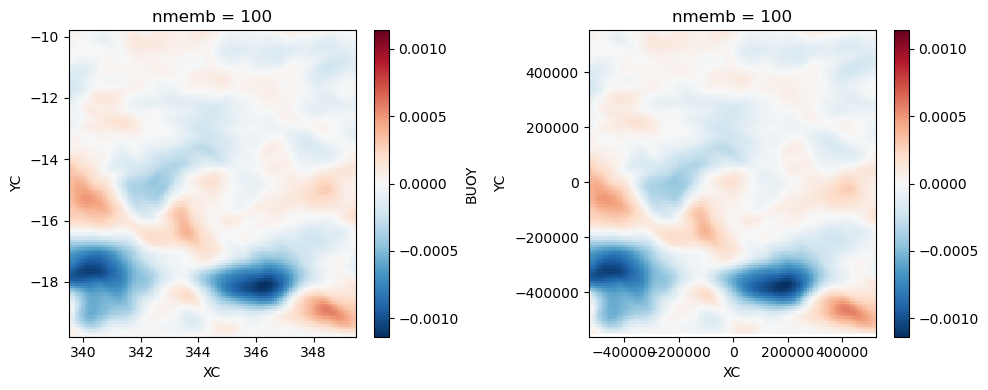

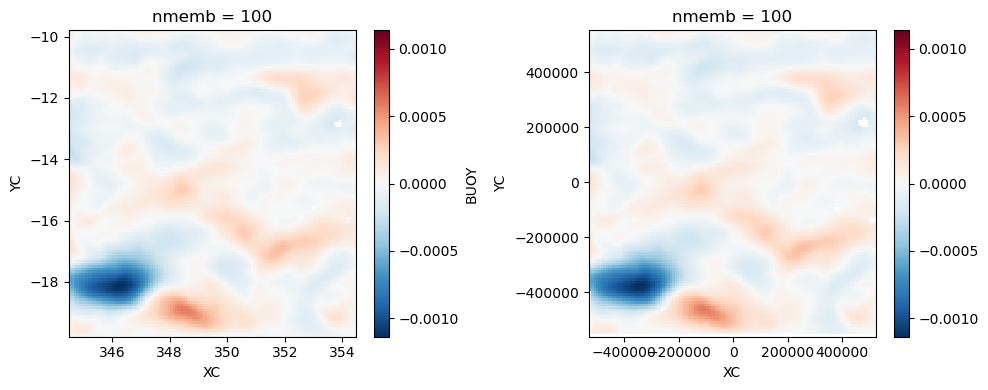

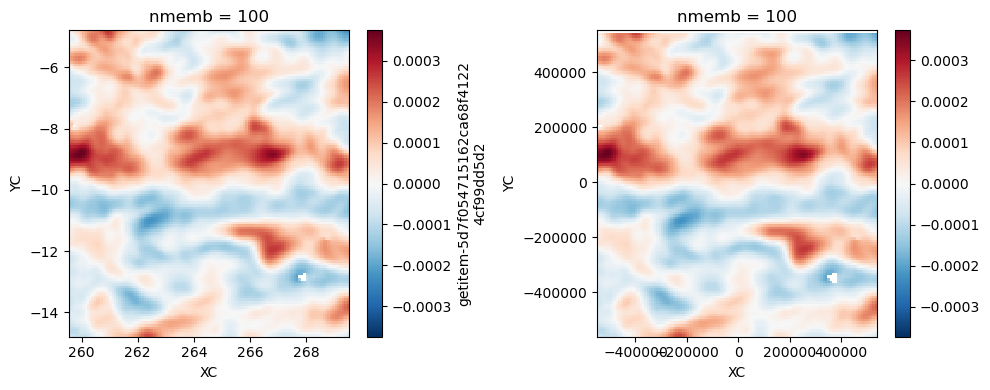

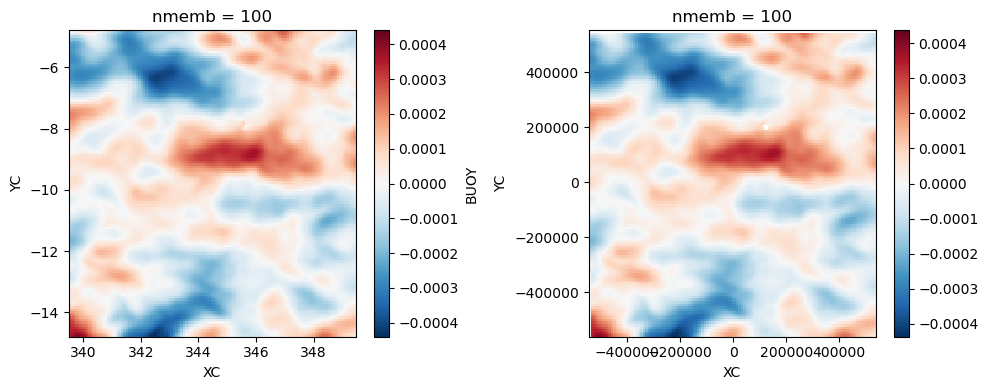

...

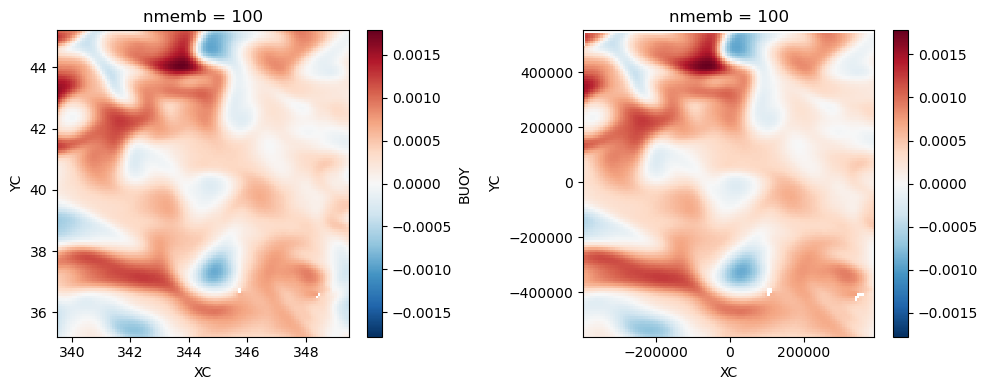

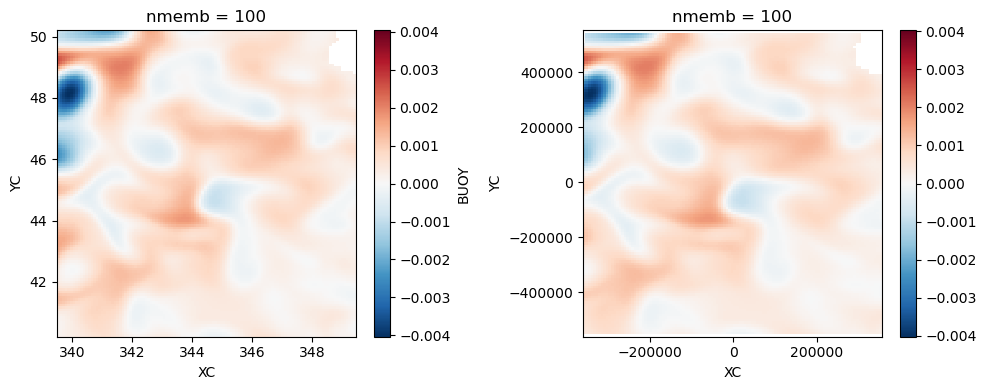

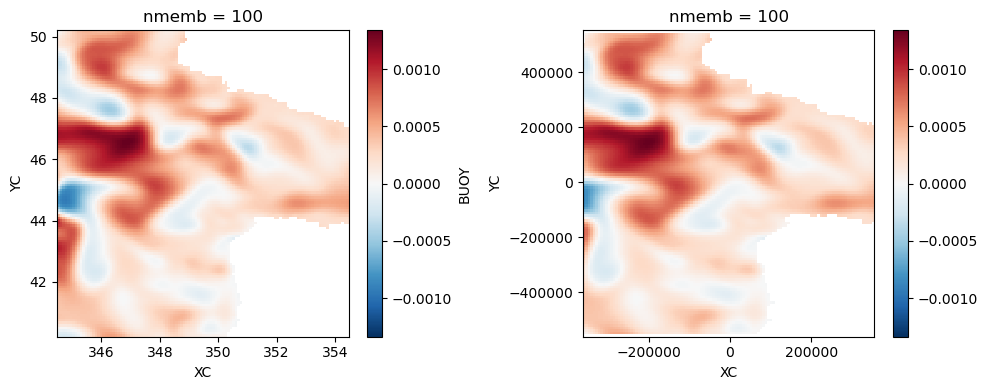

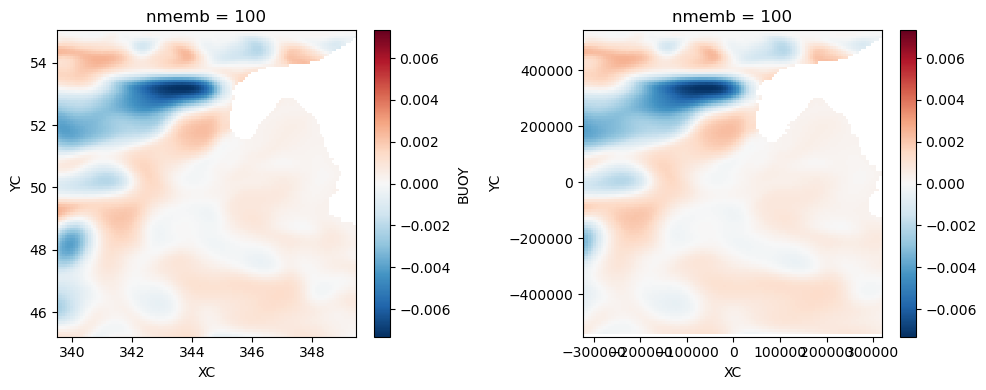

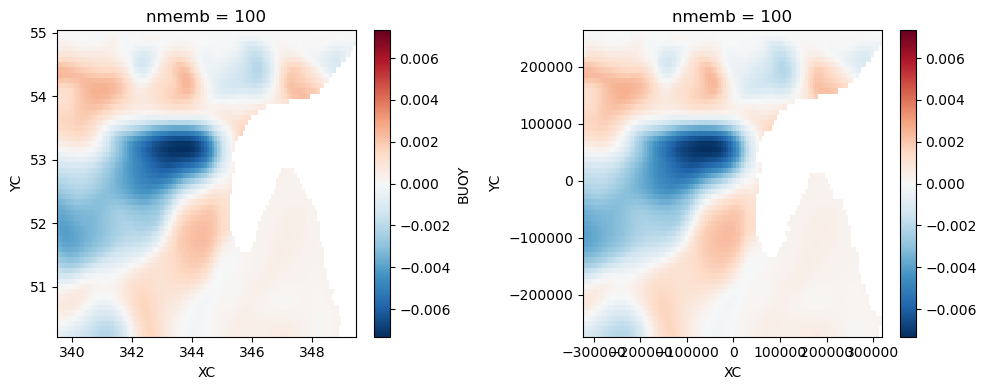

1574640


In [16]:
ystart = ySstart
nmembs = np.arange(100,148)
Zs = [18]

yys = yystart

for year in years[yystart:yystart+1]:
    if year == years[yystart]:
        mtimes = ntimes[yys,dd:]
    else:
        mtimes = ntimes[yys]
        
    for itime in mtimes[::3]:
        dsm = open_mdsdataset(op.join(ddir,'ensm/run%4d/ocn/' 
                                      % (year)), 
                              grid_dir=gdir,
                              prefix=['snap_diagOcn',], 
                              delta_t=2e2, iters=itime                              
                             ).isel(time=0,
                                    # Z=slice(17,19),
                                    # Zl=slice(17,19),
                                    # Zu=slice(17,19),
                                    # Zp1=slice(17,20)
                                   ).chunk({'YC':ychunk,'YG':ychunk,
                                            'XC':xchunk,'XG':xchunk})
        coords = {
        # "T": {"center": "time"},
        "X": {"center": "XC",  "left" : "XG"},
        "Y": {"center": "YC",  "left" : "YG"},
        "Z": {"center": "Z" ,  "outer": "Zp1", 
              "left"  : "Zl",  "right": "Zu"
             }
        }
        grid = Grid(dsm, periodic=['X'],
                    coords=coords)
        
        dsh = xr.open_zarr(op.join(savedir,'%4d/%010d/BUOY.zarr' 
                                   % (years[yystart],itime)))
        dsH = xr.open_zarr(op.join(savedir,'%4d/ensm/%010d/BUOY.zarr' 
                                   % (years[yystart],itime)))
        
        for imemb in nmembs:
            if imemb == nmembs[0]:
                ds = open_mdsdataset(op.join(ddir,'memb%02d/run%4d/ocn/' 
                                             % (imemb,year)), 
                                     grid_dir=gdir,
                                     prefix=['snap_diagOcn',], 
                                     delta_t=2e2, iters=itime                              
                                    ).isel(time=0,
                                           # Z=slice(17,19),
                                           # Zl=slice(17,19),
                                           # Zu=slice(17,19),
                                           # Zp1=slice(17,20)
                                          ).chunk({'YC':ychunk,'YG':ychunk,
                                                   'XC':xchunk,'XG':xchunk})

            else:
                ds = xr.concat([ds, open_mdsdataset(op.join(ddir,'memb%02d/run%4d/ocn/' 
                                                            % (imemb,year)), 
                                                    grid_dir=gdir,
                                                    prefix=['snap_diagOcn',], 
                                                    delta_t=2e2, iters=itime                              
                                                   ).isel(time=0, 
                                                          # Z=slice(17,19),
                                                          # Zl=slice(17,19),
                                                          # Zu=slice(17,19),
                                                          # Zp1=slice(17,20)
                                                         ).chunk({'YC':ychunk,
                                                                  'YG':ychunk,
                                                                  'XC':xchunk,
                                                                  'XG':xchunk})
                               ], 'nmemb')
        
        ds.coords['nmemb'] = nmembs
        dse = ds - dsm

###########################
        b_dagger = (dsh.BUOY - dsH.BUOY
                   ).where(ds.maskC!=0.).isel(Z=Zs[0])
        WV = grid.interp(dse.WVEL,'Z',boundary='extend'
                        ).where(ds.maskC!=0.).isel(Z=Zs[0])
        XT = grid.cumsum(ds.dxC,'X')
        YT = grid.cumsum(ds.dyC,'Y',boundary='extend')
        
        for lat in np.arange(ystart,yend+5,5):
            B = b_dagger.sel(YC=slice(lat,lat+10)).reset_coords(drop=True)
            W = WV.sel(YC=slice(lat,lat+10)).reset_coords(drop=True)
            B = B.where(np.isfinite(B)
                       )
            W = W.where(np.isfinite(W)
                       )
            X = XT.sel(YC=slice(lat,lat+10)).reset_coords(drop=True)
            Y = YT.sel(YC=slice(lat,lat+10)).reset_coords(drop=True)
            mask = dse.maskC.isel(Z=Zs[0]).sel(YC=slice(lat,lat+10)
                                              ).reset_coords(drop=True)
            for lon in np.arange(dsm.XC.min()-2.5,dsm.XC.max(),5):        
                xend = lon + 10
                if lon < dsm.XC.min():
                    dlon = dsm.XC.min() - lon
                    m = mask.sel(XC=slice(None,xend))
                    mm = mask.sel(XC=slice(dsm.XC.max()-dlon,None))
                    mmm = xr.concat([xr.DataArray(mm.data, dims=['YC','XC'],
                                          coords={'YC':m.YC,
                                                  'XC':np.linspace(lon,
                                                                   lon+dlon,
                                                                   num=len(mm.XC)+1,
                                                                   endpoint=False)[1:]}
                                                 ),
                                     m
                                    ], 'XC').sortby('XC')
                    if mmm.astype(float).sum()/np.array(mmm.shape).prod() > critt:
                        b  = B.sel(XC=slice(None,xend))
                        w  = W.sel(XC=slice(None,xend))
                        x  = X.sel(XC=slice(None,xend))
                        y  = Y.sel(XC=slice(None,xend))
                        ddx = dse.dxC.sel(YC=slice(lat,lat+10),XG=slice(None,xend)
                                         ).reset_coords(drop=True)
                        ddy = dse.dyC.sel(YG=slice(lat,lat+10),XC=slice(None,xend)
                                         ).reset_coords(drop=True)
                        a   = dse.rA.sel(YC=slice(lat,lat+10),
                                         XC=slice(None,xend)).reset_coords(drop=True)
                        bb  = B.sel(XC=slice(dsm.XC.max()-dlon,None))
                        ww  = W.sel(XC=slice(dsm.XC.max()-dlon,None))
                        xx  = (X.sel(XC=slice(dsm.XC.max()-dlon,None))
                               - X.sel(XC=slice(dsm.XC.max()-dlon,None)).isel(XC=0))
                        x = x + xx.isel(XC=-1)
                        # x.plot()
                        # plt.show()
                        yy  = Y.sel(XC=slice(dsm.XC.max()-dlon,None))
                        aa  = dse.rA.sel(YC=slice(lat,lat+10),
                                         XC=slice(dsm.XC.max()-dlon,None)
                                        ).reset_coords(drop=True)
                        dddx = dse.dxC.sel(YC=slice(lat,lat+10),XG=slice(None,xend)
                                          ).reset_coords(drop=True)
                        dddy = dse.dyC.sel(YG=slice(lat,lat+10),XC=slice(None,xend)
                                          ).reset_coords(drop=True)
                        bbb = xr.concat([xr.DataArray(bb.data, 
                                                      dims=['nmemb','YC','XC'],
                                              coords={'YC':B.YC,
                                                      'XC':np.linspace(lon,
                                                                       lon+dlon,
                                                                       num=len(bb.XC)+1,
                                                                       endpoint=False
                                                                      )[1:]}
                                                     ),
                                         b
                                        ], 'XC').sortby('XC').where(mmm!=0.)
                        www = xr.concat([xr.DataArray(ww.data, 
                                                      dims=['nmemb','YC','XC'],
                                              coords={'YC':W.YC,
                                                      'XC':np.linspace(lon,
                                                                       lon+dlon,
                                                                       num=len(ww.XC)+1,
                                                                       endpoint=False
                                                                      )[1:]}
                                                     ),
                                         w
                                        ], 'XC').sortby('XC').where(mmm!=0.)
                        xT = xr.concat([xr.DataArray(xx.data, 
                                                     dims=['YC','XC'],
                                             coords={'YC':X.YC,
                                                     'XC':np.linspace(lon,
                                                                      lon+dlon,
                                                                      num=len(xx.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    ),
                                        x
                                       ], 'XC').sortby('XC')
                        yT = xr.concat([xr.DataArray(yy.data, 
                                                     dims=['YC','XC'],
                                             coords={'YC':Y.YC,
                                                     'XC':np.linspace(lon,
                                                                      lon+dlon,
                                                                      num=len(yy.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    ),
                                        y
                                       ], 'XC').sortby('XC')
                        A = xr.concat([xr.DataArray(aa.data, 
                                                    dims=['YC','XC'],
                                            coords={'YC':a.YC,
                                                    'XC':np.linspace(lon,
                                                                     lon+dlon,
                                                                     num=len(aa.XC)+1,
                                                                     endpoint=False
                                                                    )[1:]}
                                                   ),
                                       a
                                      ], 'XC').sortby('XC')
                        ny, nx = xT.shape
                        xT = (xT - xT.isel(XC=nx//2)).values.flatten()
                        yT = (yT - yT.isel(YC=ny//2)).values.flatten()
                        dx = xr.concat([xr.DataArray(dddx.data, 
                                                     dims=['YC','XG'],
                                             coords={'YC':ddx.YC,
                                                     'XG':np.linspace(dsm.XG.min()-dlon,
                                                                      dsm.XG.min(),
                                                                      num=len(dddx.XG)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    ),
                                        ddx
                                       ], 'XG').min().values
                        dy = xr.concat([xr.DataArray(dddy.data, 
                                                     dims=['YG','XC'],
                                             coords={'YG':ddy.YG,
                                                     'XC':np.linspace(lon,
                                                                      lon+dlon,
                                                                      num=len(dddy.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    ),
                                        ddy
                                       ], 'XC').min().values
                        yy = np.arange(-ny*dy/2,ny*dy/2,dy) 
                        xx = np.arange(-nx*dx/2,nx*dx/2,dx)
                        Bterp = xr.DataArray(np.zeros_like(bbb), dims=bbb.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Wterp = xr.DataArray(np.zeros_like(www), dims=www.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Aterp = xr.DataArray(np.zeros_like(A), 
                                             dims=A.dims,
                                             coords={'YC':yy,'XC':xx}
                                            )
                        xxx, yyy = np.mgrid[-nx*dx/2:nx*dx/2:dx, -ny*dy/2:ny*dy/2:dy]
                        for nn in range(len(nmembs)):
                            Bterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (bbb.where(mmm!=0.)
                                                          * A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T 
                            Wterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (www.where(mmm!=0.)
                                                          * A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T

                        Aterp = griddata((xT, yT), 
                                         A.values.flatten(),
                                         (xxx, yyy) 
                                        ).T
                        Bterp = Bterp / Aterp
                        Wterp = Wterp / Aterp
                        # if itime == mtimes[0]:
                        fig, (ax1,ax2) = plt.subplots(figsize=(10,4), nrows=1, 
                                                      ncols=2)
                        fig.set_tight_layout(True)
                        bbb.isel(nmemb=0).plot(ax=ax1, rasterized=True)
                        Bterp.isel(nmemb=0).plot(ax=ax2, rasterized=True)
                        plt.show()
                            
                elif xend > dsm.XC.max():
                    dlon = -dsm.XC.max() + xend
                    m = mask.sel(XC=slice(lon,None))
                    mm = mask.sel(XC=slice(None,dsm.XC.min()+dlon))
                    mmm = xr.concat([m,
                                     xr.DataArray(mm.data, dims=['YC','XC'],
                                              coords={'YC':m.YC,
                                                      'XC':np.linspace(dsm.XC.max(),
                                                                       dsm.XC.max()+dlon,
                                                                       num=len(mm.XC)+1,
                                                                       endpoint=False
                                                                      )[1:]}
                                                 )
                                    ], 'XC').sortby('XC')
                    if mmm.astype(float).sum().values/np.array(mmm.shape).prod() > critt:
                        b = B.sel(XC=slice(lon,None))
                        w = W.sel(XC=slice(lon,None))
                        x = X.sel(XC=slice(lon,None))
                        y = Y.sel(XC=slice(lon,None))
                        ddx = dse.dxC.sel(YC=slice(lat,lat+10),XG=slice(lon,None)
                                         ).reset_coords(drop=True)
                        ddy = dse.dyC.sel(YG=slice(lat,lat+10),XC=slice(lon,None)
                                         ).reset_coords(drop=True)
                        a = dse.rA.sel(YC=slice(lat,lat+10),
                                       XC=slice(lon,None)).reset_coords(drop=True)
                        bb = B.sel(XC=slice(None,dsm.XC.min()+dlon))
                        ww = W.sel(XC=slice(None,dsm.XC.min()+dlon))
                        xx = X.sel(XC=slice(None,dsm.XC.min()+dlon))+X.isel(XC=-1)
                        yy = Y.sel(XC=slice(None,dsm.XC.min()+dlon))
                        aa = dse.rA.sel(YC=slice(lat,lat+10),
                                        XC=slice(None,dsm.XC.min()+dlon)
                                       ).reset_coords(drop=True)
                        dddx = dse.dxC.sel(YC=slice(lat,lat+10),
                                           XG=slice(None,dsm.XG.min()+dlon)
                                          ).reset_coords(drop=True)
                        dddy = dse.dyC.sel(YG=slice(lat,lat+10),
                                           XC=slice(None,dsm.XG.min()+dlon)
                                          ).reset_coords(drop=True)
                        bbb = xr.concat([b,
                                         xr.DataArray(bb.data, dims=['nmemb','YC','XC'],
                                              coords={'YC':B.YC,
                                                      'XC':np.linspace(dsm.XC.max(),
                                                                       dsm.XC.max()+dlon,
                                                                       num=len(bb.XC)+1,
                                                                       endpoint=False
                                                                      )[1:]}
                                                     )
                                        ], 'XC').sortby('XC')
                        www = xr.concat([w,
                                         xr.DataArray(ww.data, dims=['nmemb','YC','XC'],
                                              coords={'YC':W.YC,
                                                      'XC':np.linspace(dsm.XC.max(),
                                                                       dsm.XC.max()+dlon,
                                                                       num=len(ww.XC)+1,
                                                                       endpoint=False
                                                                      )[1:]}
                                                     )
                                        ], 'XC').sortby('XC')
                        xT = xr.concat([x,
                                        xr.DataArray(xx.data, dims=['YC','XC'],
                                             coords={'YC':X.YC,
                                                     'XC':np.linspace(dsm.XC.max(),
                                                                      dsm.XC.max()+dlon,
                                                                      num=len(xx.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    )
                                       ], 'XC').sortby('XC')
                        yT = xr.concat([y,
                                        xr.DataArray(yy.data, dims=['YC','XC'],
                                             coords={'YC':Y.YC,
                                                     'XC':np.linspace(dsm.XC.max(),
                                                                      dsm.XC.max()+dlon,
                                                                      num=len(yy.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    )
                                       ], 'XC').sortby('XC')
                        A = xr.concat([a,
                                       xr.DataArray(aa.data, dims=['YC','XC'],
                                            coords={'YC':a.YC,
                                                    'XC':np.linspace(dsm.XC.max(),
                                                                     dsm.XC.max()+dlon,
                                                                     num=len(aa.XC)+1,
                                                                     endpoint=False
                                                                    )[1:]}
                                                   )
                                      ], 'XC').sortby('XC')
                        ny, nx = xT.shape
                        xT = (xT - xT.isel(XC=nx//2)).values.flatten()
                        yT = (yT - yT.isel(YC=ny//2)).values.flatten()
                        dx = xr.concat([ddx,
                                        xr.DataArray(dddx.data, dims=['YC','XG'],
                                             coords={'YC':ddx.YC,
                                                     'XG':np.linspace(dsm.XG.max(),
                                                                      dsm.XG.max()+dlon,
                                                                      num=len(dddx.XG)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    )
                                       ], 'XG').min().values
                        dy = xr.concat([ddy,
                                        xr.DataArray(dddy.data, dims=['YG','XC'],
                                             coords={'YG':ddy.YG,
                                                     'XC':np.linspace(dsm.XC.max(),
                                                                      dsm.XC.max()+dlon,
                                                                      num=len(dddy.XC)+1,
                                                                      endpoint=False
                                                                     )[1:]}
                                                    )
                                       ], 'XC').min().values
                        yy = np.arange(-ny*dy/2,ny*dy/2,dy) 
                        xx = np.arange(-nx*dx/2,nx*dx/2,dx)
                        Bterp = xr.DataArray(np.zeros_like(bbb), dims=bbb.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Wterp = xr.DataArray(np.zeros_like(www), dims=www.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Aterp = xr.DataArray(np.zeros_like(A), 
                                             dims=A.dims,
                                             coords={'YC':yy,'XC':xx}
                                            )
                        xxx, yyy = np.mgrid[-nx*dx/2:nx*dx/2:dx, -ny*dy/2:ny*dy/2:dy]
                        for nn in range(len(nmembs)):
                            Bterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (bbb.where(mmm!=0.)
                                                          * A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T 
                            Wterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (www.where(mmm!=0.)
                                                          * A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T
                        Aterp = griddata((xT, yT), 
                                         A.values.flatten(),
                                         (xxx, yyy) 
                                        ).T
                        Bterp = Bterp / Aterp
                        Wterp = Wterp / Aterp
                        # if itime == mtimes[dd]:
                        fig, (ax1,ax2) = plt.subplots(figsize=(10,4), nrows=1, 
                                                      ncols=2)
                        fig.set_tight_layout(True)
                        bbb.isel(nmemb=0).plot(ax=ax1, rasterized=True)
                        Bterp.isel(nmemb=0).plot(ax=ax2, rasterized=True)
                        plt.show()
                else:
                    mmm = mask.sel(XC=slice(lon,xend))
                    if mmm.astype(float).sum().values/np.array(mmm.shape).prod() > critt:
                        bbb = B.sel(XC=slice(lon,xend)).where(mmm!=0.)
                        www = W.sel(XC=slice(lon,xend)).where(mmm!=0.)
                        xT = X.sel(XC=slice(lon,xend))
                        yT = Y.sel(XC=slice(lon,xend))
                        A = dse.rA.sel(YC=slice(lat,lat+10),
                                       XC=slice(lon,xend)).where(mmm!=0.)
                        ny, nx = xT.shape
                        xT = (xT - xT.isel(XC=nx//2)).values.flatten()
                        yT = (yT - yT.isel(YC=ny//2)).values.flatten()
                        dx = ds.dxC.sel(YC=slice(lat,lat+10),XG=slice(lon,xend)
                                       ).min().values
                        dy = ds.dyC.sel(YG=slice(lat,lat+10),XC=slice(lon,xend)
                                       ).min().values
                        yy = np.arange(-ny*dy/2,ny*dy/2,dy) 
                        xx = np.arange(-nx*dx/2,nx*dx/2,dx)
                        Bterp = xr.DataArray(np.zeros_like(bbb), dims=bbb.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Wterp = xr.DataArray(np.zeros_like(www), dims=www.dims,
                                             coords={'nmemb':nmembs,'YC':yy,
                                                     'XC':xx}
                                            )
                        Aterp = xr.DataArray(np.zeros_like(A), 
                                             dims=A.dims,
                                             coords={'YC':yy,'XC':xx}
                                            )
                        xxx, yyy = np.mgrid[-nx*dx/2:nx*dx/2:dx, -ny*dy/2:ny*dy/2:dy]
                        for nn in range(len(nmembs)):
                            Bterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (bbb*A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T 
                            Wterp[dict(nmemb=nn)] = griddata((xT, yT), 
                                                         (www*A
                                                         ).isel(nmemb=nn).values.flatten(),
                                                         (xxx, yyy) 
                                                            ).T
                        Aterp = griddata((xT, yT), 
                                         ds.rA.sel(YC=slice(lat,lat+10),
                                                   XC=slice(lon,xend)).values.flatten(),
                                         (xxx, yyy) 
                                        ).T
                        Bterp = Bterp / Aterp
                        Wterp = Wterp / Aterp
                        if lon == dsm.XC.min():
                            fig, (ax1,ax2) = plt.subplots(figsize=(10,4), 
                                                          nrows=1, ncols=2)
                            fig.set_tight_layout(True)
                            bbb.isel(nmemb=0).plot(ax=ax1, rasterized=True)
                            Bterp.isel(nmemb=0).plot(ax=ax2, rasterized=True)
                            plt.show()
                
                
                if mmm.astype(float).sum().values/np.array(mmm.shape).prod() > critt:
                    iso_csUf = xrft.isotropic_power_spectrum(
                                Bterp.interpolate_na(dim='XC'
                                                    ).interpolate_na(dim='YC').fillna(0.),  
                                dim=["YC", "XC"], window='hann', 
                                window_correction=True, true_amplitude=True, 
                                truncate=True
                    )
                    # iso_csUf = xrft.isotropic_cross_spectrum(
                                # Uterp.interpolate_na(dim='XC'
                                #                     ).interpolate_na(dim='YC'
                                #                                     ).fillna(0.), 
                                # AUterp.interpolate_na(dim='XC'
                                #                      ).interpolate_na(dim='YC'
                                #                                      ).fillna(0.), 
                    #             dim=["YC", "XC"], window='hann', 
                    #         window_correction=True, true_amplitude=True, truncate=True
                    # ) 
                    # iso_csVf = xrft.isotropic_cross_spectrum(
                    #             Vterp.interpolate_na(dim='YC'
                    #                                 ).interpolate_na(dim='XC'
                    #                                                 ).fillna(0.), 
                    #             AVterp.interpolate_na(dim='YC'
                    #                                  ).interpolate_na(dim='XC'
                    #                                                  ).fillna(0.), 
                    #             dim=["YC", "XC"], window='hann', 
                    #         window_correction=True, true_amplitude=True, truncate=True
                    # )
                    # if itime == mtimes[0] and lon == dsm.XC.min():
                    #     fig, ax = plt.subplots()
                    #     ax.plot(iso_csUf.freq_r*1e3, 
                    #             -.5*(iso_csUf + iso_csVf).mean('nmemb'))
                    #     ax.set_xscale('log')
                    #     plt.show()
                    # dsave = iso_csUf.to_dataset(name='U')
                    # dsave['V'] = iso_csVf
                    la = A.YC.mean().values
                    lo = A.XC.mean().values
                    # if la < 0.:
                    #     fname = (
                    #   'Z0452/MOM/Snap/%010d/Fourier/CrossSpectra/Lat-%03d_Lon%03d.zarr' 
                    #              % (itime,np.floor(np.abs(la)),np.floor(lo)))
                    # else:
                    #     fname = (
                    #   'Z0452/MOM/Snap/%010d/Fourier/CrossSpectra/Lat%03d_Lon%03d.zarr' 
                    #              % (itime,np.floor(la),np.floor(lo)))
                    # dsave.attrs['Lat'] = la
                    # dsave.attrs['Lon'] = lo
                    # dsave.to_zarr(op.join(spec,fname), mode='w')
                    # dsave.close()

                    ss = xr.DataArray(np.linspace(iso_csUf.freq_r[-1].data**-1,
                                                  iso_csUf.freq_r[0].data**-1,40
                                                 )/xo,
                                      dims=['scale'], 
                              coords={'scale':np.linspace(iso_csUf.freq_r[-1].data**-1,
                                                          iso_csUf.freq_r[0].data**-1,40
                                                         )/xo}
                    )
                    ssf = xr.DataArray(iso_csUf.freq_r.data**-1/xo, dims=['scale'], 
                                       coords={'scale':iso_csUf.freq_r.data**-1/xo}
                                      )
                    ssh = xr.concat([ss.where(ss>50e3/xo).dropna('scale')[::-1],
                                     ssf.where(ssf<50e3/xo).dropna('scale')
                                    ], 'scale')
                    iso_csWw = xwavelet.wvlt_cross_spectrum(
                                    Wterp.chunk({'nmemb':1}), Bterp.chunk({'nmemb':1}), 
                                    ssh, dim=["YC", "XC"], 
                                    xo=xo, ntheta=ntheta
                    ) 
                    if la < 0.:
                        fname = (
                        'Z0452/MOM/Snap/%010d/Wavelet/wb/Lat-%03d_Lon%03d.zarr' 
                                 % (itime,np.floor(np.abs(la)),np.floor(lo)))
                    else:
                        fname = (
                        'Z0452/MOM/Snap/%010d/Wavelet/wb/Lat%03d_Lon%03d.zarr' 
                                 % (itime,np.floor(la),np.floor(lo)))
                    dsave = iso_csWw.to_dataset(name='W')
                    dsave.attrs['Lat'] = la
                    dsave.attrs['Lon'] = lo
                    dsave.to_zarr(op.join(spec,fname), mode='w')
                    dsave.close()
                    del iso_csWw, Bterp, Wterp
                    
        dse.close()
        dsm.close()
        ds.close()
        dsh.close()
        dsH.close()
        
        print(itime)
    yys += 1

In [69]:
ystart = ySstart
nmembs = np.arange(100,148)

yys = yystart
dsm = open_mdsdataset(op.join(ddir,'ensm/run%4d/ocn/' 
                              % (years[yystart])), 
                      grid_dir=gdir,
                      prefix=['snap_diagOcn',], 
                      delta_t=2e2, iters=ntimes[0,0]                              
                     ).isel(time=0
                           ).chunk({'YC':ychunk,'YG':ychunk,
                                    'XC':xchunk,'XG':xchunk})
coords = {
        # "T": {"center": "time"},
        "X": {"center": "XC",     "left" : "XG"},
        "Y": {"center": "YC",     "left" : "YG"},
        "Z": {"center": "Z" ,     "outer": "Zp1", 
              "left"  : "Zl",     "right": "Zu"}
        }
grid = Grid(dsm, periodic=['X'],
            coords=coords)
Hktran = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
Stktran = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
Ssktran = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
Hktran_full = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
Stktran_full = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
Ssktran_full = xr.DataArray(np.ones((len(np.arange(ystart+5,yend+10,5)),
                               len(np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5))
                              )), dims=['YC','XC'], 
                      coords={'YC':np.arange(ystart+5,yend+10,5),
                              'XC':np.arange(dsm.XC.min()+2.5,dsm.XC.max()+5,5)}
                     ) * np.nan
length = 120e3

for year in years[yystart:yystart+1]:
    if year == years[yystart]:
        mtimes = ntimes[yys,:1]
    else:
        mtimes = ntimes[yys]
        
    for itime in mtimes:       
        iy = 0
        for lat in np.arange(ystart,yend+5,5):
            mask = dsm.maskC.isel(Z=18).sel(YC=slice(lat,lat+10)
                                           ).reset_coords(drop=True)
            ix = 0
            for lon in np.arange(dsm.XC.min()-2.5,dsm.XC.max(),5):    
                xend = lon + 10
                if lon < dsm.XC.min():
                    dlon = dsm.XC.min() - lon
                    m = mask.sel(XC=slice(None,xend))
                    mm = mask.sel(XC=slice(dsm.XC.max()-dlon,None))
                    mmm = xr.concat([xr.DataArray(mm.data, dims=['YC','XC'],
                                          coords={'YC':m.YC,
                                                  'XC':np.linspace(lon,
                                                                   lon+dlon,
                                                                   num=len(mm.XC)+1,
                                                                   endpoint=False)[1:]}
                                                 ),
                                     m
                                    ], 'XC').sortby('XC')
                    la = mmm.YC.mean()
                    lo = mmm.XC.mean()
                    crit = mmm.astype(float).sum().values/np.array(mmm.shape).prod()
                    if crit > critt:
                        if la < 0.:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                        else:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                        ds0_trans = xr.open_zarr(op.join(spec,fname0))
                        ds1_trans = xr.open_zarr(op.join(spec,fname1))
                        ds2_trans = xr.open_zarr(op.join(spec,fname2))
                        dks = xr.DataArray(np.abs(np.diff(ds0_trans.scale**-1)).data, 
                                           dims='scale',
                                       coords={'scale':.5*(ds0_trans.scale[1:].data 
                                                           + ds0_trans.scale[:-1].data)}
                                          ).interp(scale=ds0_trans.scale, 
                                                   kwargs={"fill_value": "extrapolate"})
                        Tk = (ds1_trans.U + ds1_trans.V + ds1_trans.W)
                        Sk = (ds2_trans.U + ds2_trans.V + ds2_trans.W)
                        Hk = (ds0_trans.U + ds0_trans.V + ds0_trans.W)

                        sk = (Sk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        tk = (Tk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        hk = (Hk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        if crit == 1.:
                            Ssktran_full[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran_full[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran_full[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                        else:
                            Ssktran[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                elif xend > dsm.XC.max():
                    dlon = -dsm.XC.max() + xend
                    m = mask.sel(XC=slice(lon,None))
                    mm = mask.sel(XC=slice(None,dsm.XC.min()+dlon))
                    mmm = xr.concat([m,
                                     xr.DataArray(mm.data, dims=['YC','XC'],
                                          coords={'YC':m.YC,
                                                  'XC':np.linspace(dsm.XC.max(),
                                                                   dsm.XC.max()+dlon,
                                                                   num=len(mm.XC)+1,
                                                                   endpoint=False)[1:]}
                                                 )
                                    ], 'XC').sortby('XC')
                    la = mmm.YC.mean()
                    lo = mmm.XC.mean()
                    crit = mmm.astype(float).sum().values/np.array(mmm.shape).prod()
                    if crit > critt:
                        if la < 0.:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                        else:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                        ds0_trans = xr.open_zarr(op.join(spec,fname0))
                        ds1_trans = xr.open_zarr(op.join(spec,fname1))
                        ds2_trans = xr.open_zarr(op.join(spec,fname2))
                        dks = xr.DataArray(np.abs(np.diff(ds0_trans.scale**-1)).data, 
                                           dims='scale',
                                       coords={'scale':.5*(ds0_trans.scale[1:].data 
                                                           + ds0_trans.scale[:-1].data)}
                                          ).interp(scale=ds0_trans.scale, 
                                                   kwargs={"fill_value": "extrapolate"})
                        Tk = (ds1_trans.U + ds1_trans.V + ds1_trans.W)
                        Sk = (ds2_trans.U + ds2_trans.V + ds2_trans.W)
                        Hk = (ds0_trans.U + ds0_trans.V + ds0_trans.W)

                        sk = (Sk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        tk = (Tk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        hk = (Hk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        if crit == 1.:
                            Ssktran_full[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran_full[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran_full[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                        else:
                            Ssktran[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                else:
                    mmm = mask.sel(XC=slice(lon,xend))
                    la = mmm.YC.mean()
                    lo = mmm.XC.mean()
                    crit = mmm.astype(float).sum().values/np.array(mmm.shape).prod()
                    if crit > critt:
                        if la < 0.:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat-%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(np.abs(la)),np.floor(lo)))
                        else:
                            fname0 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Hk/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname1 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Theta/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                            fname2 = (
                            'Z0452/MOM/Snap/%010d/Wavelet/Sk/Salt/Lat%03d_Lon%03d.zarr' 
                                     % (itime,np.floor(la),np.floor(lo)))
                        ds0_trans = xr.open_zarr(op.join(spec,fname0))
                        ds1_trans = xr.open_zarr(op.join(spec,fname1))
                        ds2_trans = xr.open_zarr(op.join(spec,fname2))
                        dks = xr.DataArray(np.abs(np.diff(ds0_trans.scale**-1)).data, 
                                           dims='scale',
                                           coords={'scale':.5*(ds0_trans.scale[1:].data 
                                                               + ds0_trans.scale[:-1].data)}
                                          ).interp(scale=ds0_trans.scale, 
                                                   kwargs={"fill_value": "extrapolate"})
                        Tk = (ds1_trans.U + ds1_trans.V + ds1_trans.W)
                        Sk = (ds2_trans.U + ds2_trans.V + ds2_trans.W)
                        Hk = (ds0_trans.U + ds0_trans.V + ds0_trans.W)

                        sk = (Sk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        tk = (Tk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        hk = (Hk.sum('angle') 
                              * np.diff(ds0_trans.angle)[0]*2
                             ).mean('nmemb')
                        if crit == 1.:
                            Ssktran_full[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran_full[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran_full[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                        else:
                            Ssktran[dict(YC=iy,XC=ix)] = sk.sel(scale=length, method='nearest'
                                                           )   
                            Stktran[dict(YC=iy,XC=ix)] = tk.sel(scale=length, method='nearest'
                                                           )   
                            Hktran[dict(YC=iy,XC=ix)] = hk.sel(scale=length, method='nearest'
                                                           )   
                
                ds0_trans.close()
                ds1_trans.close()
                ds2_trans.close()
                ix += 1
            iy += 1

        dsm.close()
        print(itime)
    yys += 1

# KEflux[dict(XC=0)] = KEflux.isel(XC=-1)
Hktran

1419120


<xarray.DataArray (YC: 15, XC: 18)>
array([[-8.11895989e-05, -7.93857561e-05, -8.53602649e-05,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
         3.98081021e-04,             nan,             nan,
                    nan,             nan, -4.14150425e-05],
       [-4.10651689e-05,  1.62856502e-05, -9.48500379e-05,
        -2.74041900e-04,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,  1.92948220e-05,             nan,
                    nan, -3.48888859e-05, -4.35363330e-05],
       [-2.93711397e-04, -1.93242981e-04, -2.88644377e-04,
        -6.06868301e-05,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan, -4.81265609e-04,             nan,
                    nan, -5.17492461e-04, -3.82707950e-04],
       [-1.05681797e-03, -6.77416965e-04, -2.92723189e-04,
        -2.64418060e-04,             nan,             nan,
...
        -1.06211549e-03,  3.97244666e-04, -3.39847797e-04,
         1.69010424e-04,  7.17602309e-04,             nan],
       [            nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan, -9.50372480e-03, -3.09529315e-04,
                    nan,             nan,             nan,
                    nan,  5.84501130e-04,  7.15012458e-04],
       [            nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,  1.21848115e-04, -2.89824071e-05,
                    nan,             nan,             nan,
                    nan, -9.14457933e-04,             nan],
       [            nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,  2.79316624e-05,             nan,
                    nan,             nan,             nan,
                    nan, -5.90921208e-04,             nan]])
Coordinates:
  * YC       (YC) float64 -14.8 -9.8 -4.8 0.2 5.2 ... 35.2 40.2 45.2 50.2 55.2
  * XC       (XC) float64 264.5 269.5 274.5 279.5 ... 334.5 339.5 344.5 349.5

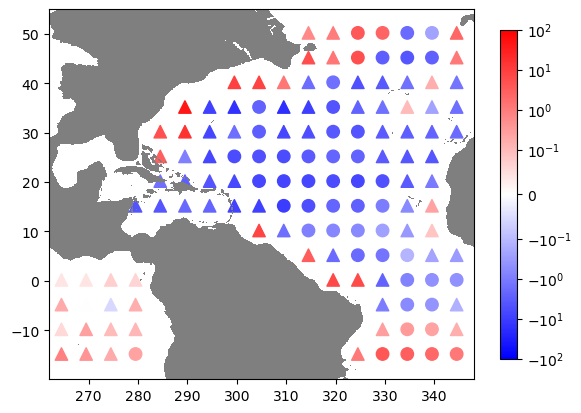

In [64]:
xx, yy = np.meshgrid(Sktran.XC, Sktran.YC.isel(YC=slice(None,-1)))

fig, ax = plt.subplots(figsize=(6,5))
fig.set_tight_layout(True)
# im = ax.pcolormesh(KEflux.XC, KEflux.YC.isel(YC=slice(None,-1)), 
#                    KEflux.isel(YC=slice(None,-1)), cmap='RdBu_r',
#               vmin=-1e-9, vmax=1e-9, rasterized=True
#              )
im = ax.scatter(xx, yy, 
                s=80, marker='^',
                c=(Stktran+Ssktran).isel(YC=slice(None,-1)), cmap='bwr',
                rasterized=True,
                norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
             )
ax.scatter(xx, yy, 
           s=80,
           c=(Stktran_full+Ssktran_full).isel(YC=slice(None,-1)), cmap='bwr',
           rasterized=True,
           norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
          )
ax.pcolormesh(dsm.XC, dsm.YC, dsm.maskC.where(dsm.maskC==0.).isel(Z=18),
              vmin=-2, vmax=2, cmap='binary', rasterized=True
             )
ax.set_xlim([dsm.XC.min(), dsm.XC.max()])
ax.set_ylim([dsm.YC.min(), dsm.YC.max()])
ax.set_aspect(True)
cbar = fig.colorbar(im, ax=ax, shrink=.7)
# cbar.set_label(r"$\varepsilon_K$", fontsize=12)
plt.savefig(op.join(spec,'Figs/Sk_Z0452_s=%03dkm_%010d_xgcm.pdf' 
                    % (int(length*1e-3), ntimes[0,0])))

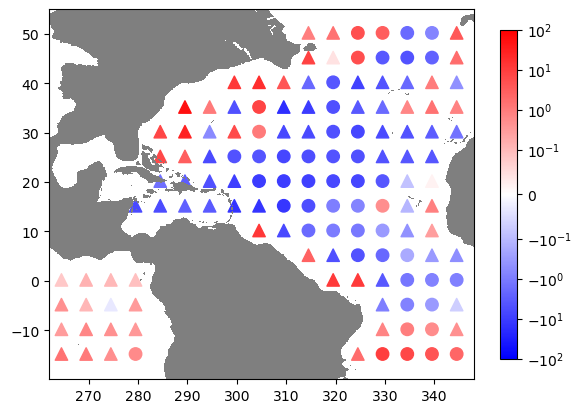

In [65]:
xx, yy = np.meshgrid(Sktran.XC, Sktran.YC.isel(YC=slice(None,-1)))

fig, ax = plt.subplots(figsize=(6,5))
fig.set_tight_layout(True)
# im = ax.pcolormesh(KEflux.XC, KEflux.YC.isel(YC=slice(None,-1)), 
#                    KEflux.isel(YC=slice(None,-1)), cmap='RdBu_r',
#               vmin=-1e-9, vmax=1e-9, rasterized=True
#              )
im = ax.scatter(xx, yy, 
                s=80, marker='^',
                c=(Stktran).isel(YC=slice(None,-1)), cmap='bwr',
                rasterized=True,
                norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
             )
ax.scatter(xx, yy, 
           s=80,
           c=(Stktran_full).isel(YC=slice(None,-1)), cmap='bwr',
           rasterized=True,
           norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
          )
ax.pcolormesh(dsm.XC, dsm.YC, dsm.maskC.where(dsm.maskC==0.).isel(Z=18),
              vmin=-2, vmax=2, cmap='binary', rasterized=True
             )
ax.set_xlim([dsm.XC.min(), dsm.XC.max()])
ax.set_ylim([dsm.YC.min(), dsm.YC.max()])
ax.set_aspect(True)
cbar = fig.colorbar(im, ax=ax, shrink=.7)
# cbar.set_label(r"$\varepsilon_K$", fontsize=12)
plt.savefig(op.join(spec,'Figs/Stk_Z0452_s=%03dkm_%010d_xgcm.pdf' 
                    % (int(length*1e-3), ntimes[0,0])))

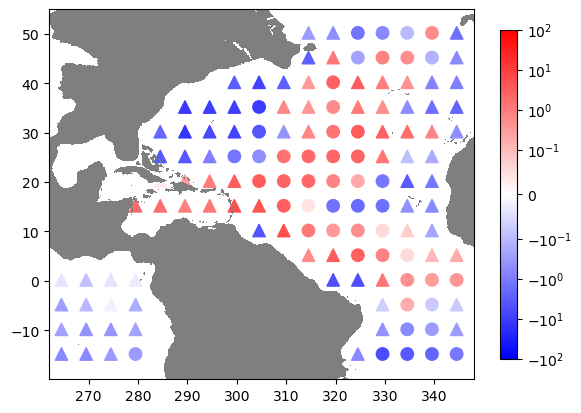

In [66]:
xx, yy = np.meshgrid(Sktran.XC, Sktran.YC.isel(YC=slice(None,-1)))

fig, ax = plt.subplots(figsize=(6,5))
fig.set_tight_layout(True)
# im = ax.pcolormesh(KEflux.XC, KEflux.YC.isel(YC=slice(None,-1)), 
#                    KEflux.isel(YC=slice(None,-1)), cmap='RdBu_r',
#               vmin=-1e-9, vmax=1e-9, rasterized=True
#              )
im = ax.scatter(xx, yy, 
                s=80, marker='^',
                c=(Ssktran).isel(YC=slice(None,-1)), cmap='bwr',
                rasterized=True,
                norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
             )
ax.scatter(xx, yy, 
           s=80,
           c=(Ssktran_full).isel(YC=slice(None,-1)), cmap='bwr',
           rasterized=True,
           norm=clr.SymLogNorm(linthresh=1e-1, vmin=-1e2, vmax=1e2)
          )
ax.pcolormesh(dsm.XC, dsm.YC, dsm.maskC.where(dsm.maskC==0.).isel(Z=18),
              vmin=-2, vmax=2, cmap='binary', rasterized=True
             )
ax.set_xlim([dsm.XC.min(), dsm.XC.max()])
ax.set_ylim([dsm.YC.min(), dsm.YC.max()])
ax.set_aspect(True)
cbar = fig.colorbar(im, ax=ax, shrink=.7)
# cbar.set_label(r"$\varepsilon_K$", fontsize=12)
plt.savefig(op.join(spec,'Figs/Ssk_Z0452_s=%03dkm_%010d_xgcm.pdf' 
                    % (int(length*1e-3), ntimes[0,0])))

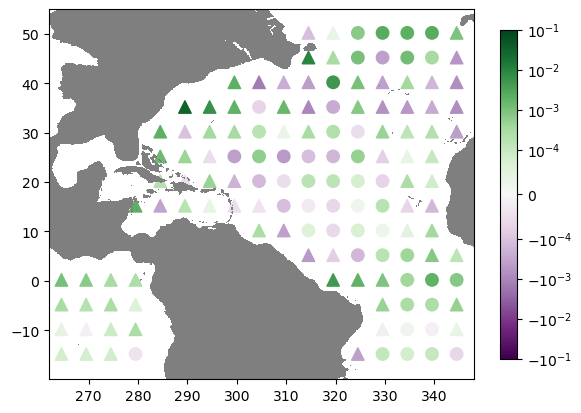

In [70]:
xx, yy = np.meshgrid(Sktran.XC, Sktran.YC.isel(YC=slice(None,-1)))

fig, ax = plt.subplots(figsize=(6,5))
fig.set_tight_layout(True)
# im = ax.pcolormesh(KEflux.XC, KEflux.YC.isel(YC=slice(None,-1)), 
#                    KEflux.isel(YC=slice(None,-1)), cmap='RdBu_r',
#               vmin=-1e-9, vmax=1e-9, rasterized=True
#              )
im = ax.scatter(xx, yy, 
                s=80, marker='^',
                c=-Hktran.isel(YC=slice(None,-1)), cmap='PRGn',
                rasterized=True,
                norm=clr.SymLogNorm(linthresh=1e-4, vmin=-1e-1, vmax=1e-1)
             )
ax.scatter(xx, yy, 
           s=80,
           c=-Hktran_full.isel(YC=slice(None,-1)), cmap='PRGn',
           rasterized=True,
           norm=clr.SymLogNorm(linthresh=1e-4, vmin=-1e-1, vmax=1e-1)
          )
ax.pcolormesh(dsm.XC, dsm.YC, dsm.maskC.where(dsm.maskC==0.).isel(Z=18),
              vmin=-2, vmax=2, cmap='binary', rasterized=True
             )
ax.set_xlim([dsm.XC.min(), dsm.XC.max()])
ax.set_ylim([dsm.YC.min(), dsm.YC.max()])
ax.set_aspect(True)
cbar = fig.colorbar(im, ax=ax, shrink=.7)
# cbar.set_label(r"$\varepsilon_K$", fontsize=12)
plt.savefig(op.join(spec,'Figs/Hk_Z0452_s=%03dkm_%010d_xgcm.pdf' 
                    % (int(length*1e-3), ntimes[0,0])))